<a href="https://colab.research.google.com/github/lardonels/Trabalhos-Faculdade/blob/main/PDI/M1.1/Trabalho_M1_PDI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from PIL import Image

# 1. Manipulação de Pixels
a. Escreva uma função que receba uma imagem colorida e determine a cor que
ocorre com maior
frequência na imagem.  
b. Escreva uma função denominada mergeImage que receba duas imagens, fg e bg, extraia o objeto em
primeiro plano e o insira no plano de fundo, retornando a imagem resultante.  
c. Teste a função utilizando diferentes imagens de primeiro plano e de plano de fundo, à sua escolha, e
apresente os resultados.

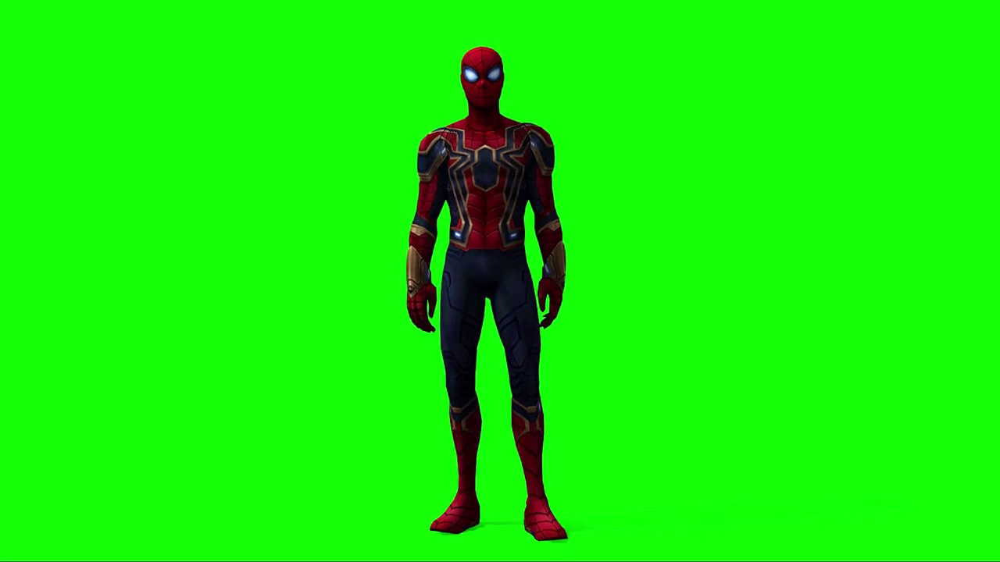

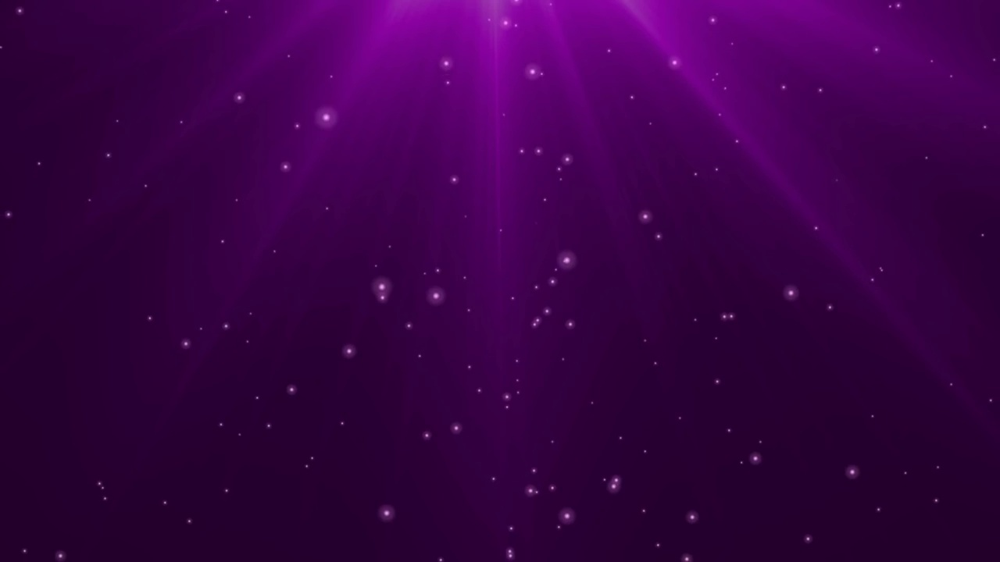

In [ ]:
fg = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/fg.jpg',1)
cv2_imshow(fg)
bg = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/bg.jpg',1)
cv2_imshow(bg)

In [ ]:
#a
def cor_mais_frequente(img):
  pixels = img.reshape(-1,3)
  #remodela a matriz para uma lista, "empilhando" cada pixel - (altura, largura, 3) -> (N, 3), -1 deixa a numpy calcular o N

  cores, cont = np.unique(pixels, axis=0, return_counts=True)
  #passa pela lista de pixels, contando quantas vezes cada cor aparece, garante que cada linha seja tratada como unidade e atribui tanto a cor quanto a contagem em variáveis
  cor = cores[np.argmax(cont)]
  #descobre qual a cor com maior contagem

  return cor

print(cor_mais_frequente(fg))
print(cor_mais_frequente(bg))

[  8 255  21]
[52  0 40]


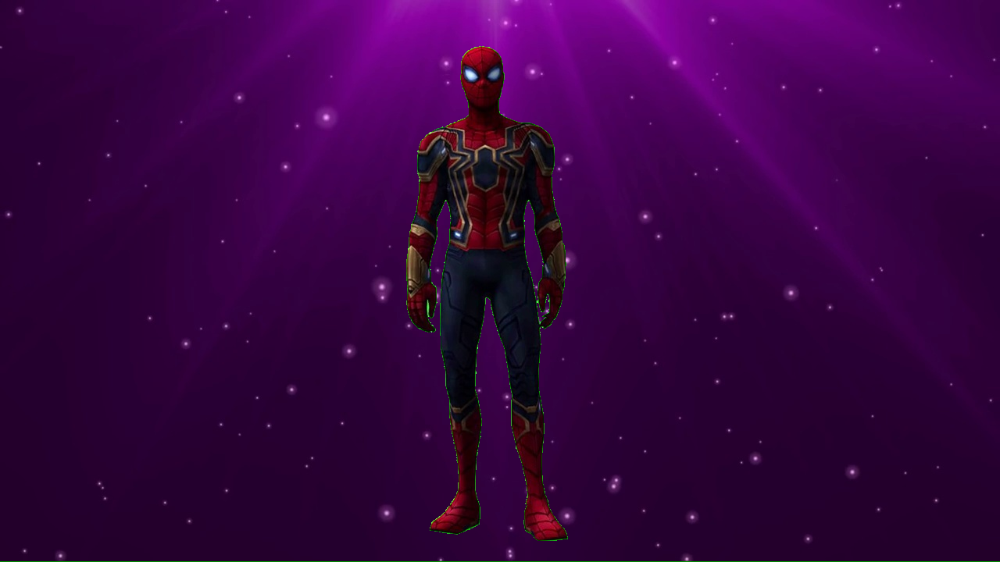

In [ ]:
#b
def mergeImage(fg,bg):
  bg_resize = cv2.resize(bg, (fg.shape[1], fg.shape[0]))
  #transforma o tamanho da imagem de fundo para o tamanho da imagem da frente
  resultado = np.copy(fg)
  #cria uma copia da imagem da frente, para nao destruir a imagem de entrada

  tol = 80
  #define a tolerancia da mascara (a grossura da borda verde em volta da imagem)

  bg_remover = cor_mais_frequente(fg)
  #pega qual a cor mais frequente na imagem para ser removida

  fg_int16 = fg.astype(np.int16)
  #transforma em int16 para aceitar numeros negativos, sem estourar
  novo_fg = fg_int16 - bg_remover
  #diminui a cor de fundo dos pixels
  dist = np.abs(novo_fg)
  #define a distancia do pixel da cor mais frequente
  mascara = (dist<=tol).all(axis=2)
  #compara cada canal da distancia com a tolerancia, resultando cada um como true ou false, o all exige que os tres sejam true para o pixel não ser apagado e o axis aponta para o eixo dos canais, como a imagem é 2d, 2

  resultado[mascara] = bg_resize[mascara]
  #indexa a mascara nas duas imagens

  return resultado

imagem = mergeImage(fg,bg)
cv2_imshow(imagem)

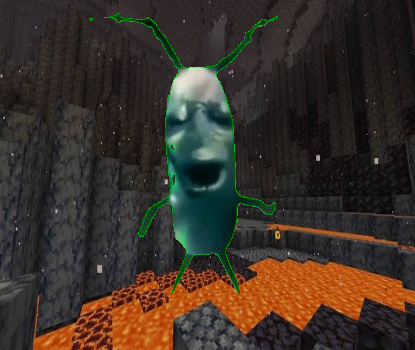

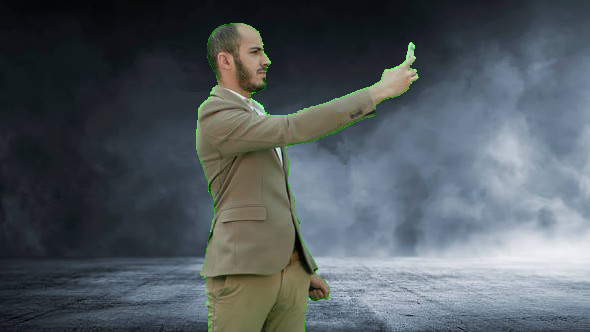

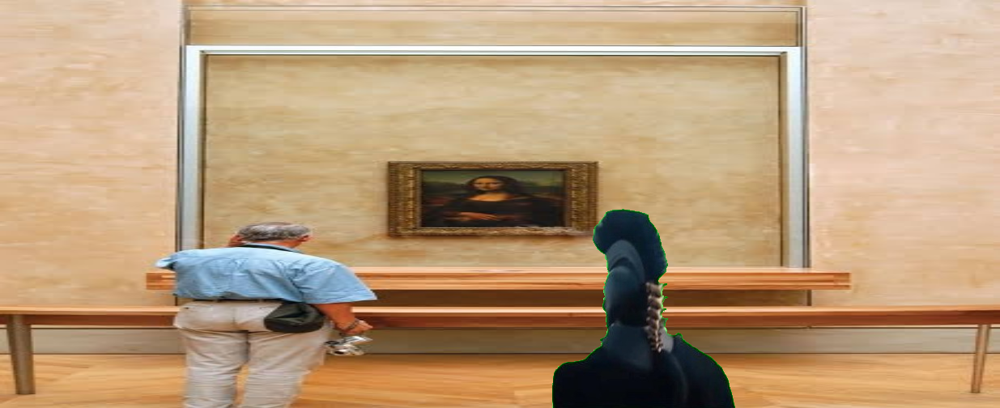

In [ ]:
#c

fg1 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/planckton.jpg', 1)
bg1 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/nether.jpg', 1)
fg2 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/fg1.jpg', 1)
bg2 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/bg1.jpg', 1)
fg3 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/agamammammenom.jpg', 1)
bg3 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/arte.jpg', 1)


img1 = mergeImage(fg1,bg1)
img2 = mergeImage(fg2,bg2)
img3 = mergeImage(fg3,bg3)

cv2_imshow(img1)
cv2_imshow(img2)
cv2_imshow(img3)

# 2. Expansão de Contraste - terminar c
a. Escreva uma função denominada linContrastStretching que receba uma imagem em tons de cinza
im e os valores a e b, e realce o contraste de modo que o intervalo de intensidade resultante seja
[a,b].  
b. Exiba a imagem de entrada e a imagem resultante lado a lado, juntamente com suas barras de
cores (uma faixa contendo as k cores que ocorrem com maior frequência). Apresente uma
explicação adequada para as barras de cores obtidas.  
c. Utilize sua função em múltiplas imagens e justifique por que o efeito é mais pronunciado em
algumas imagens, enquanto em outras ele não é tão evidente.

In [ ]:
img1 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/bellbw.jpg', 0)
img2 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/clearbw.jpg', 0)
img3 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/cameraman.png', 0)

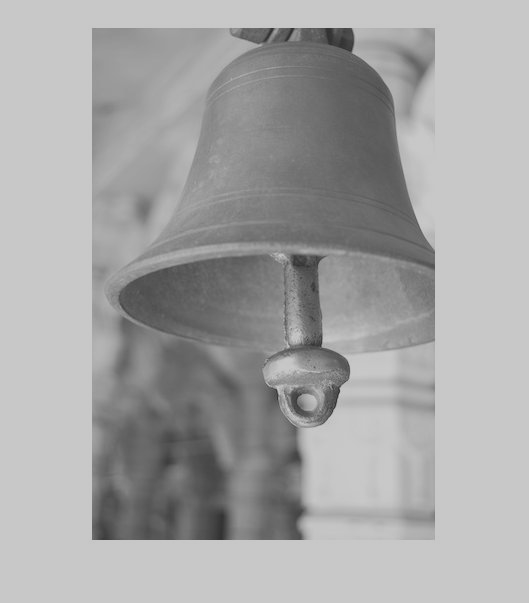

50 200


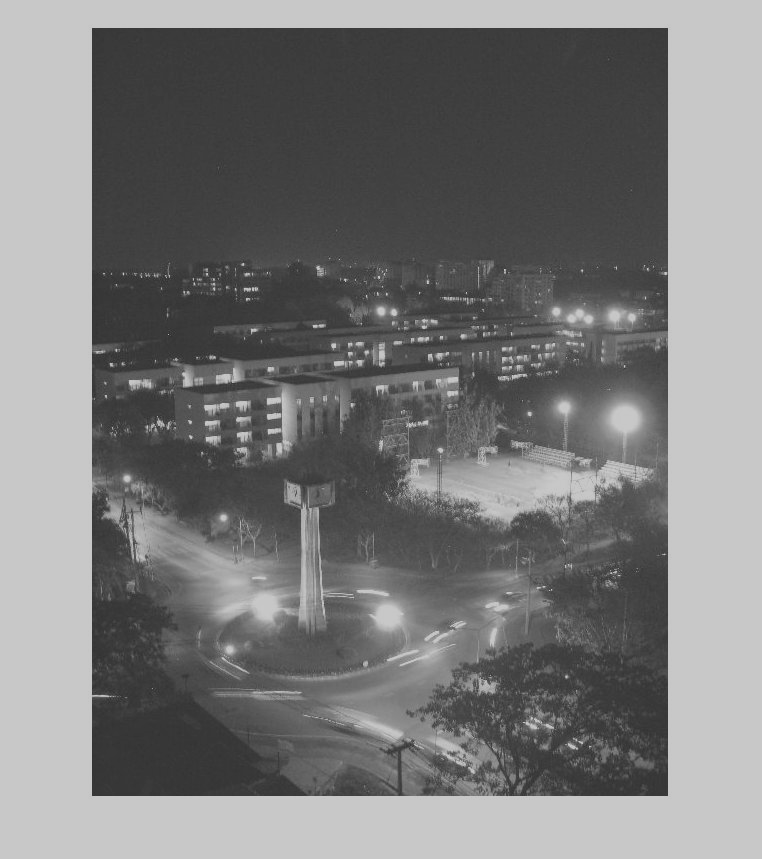

50 200


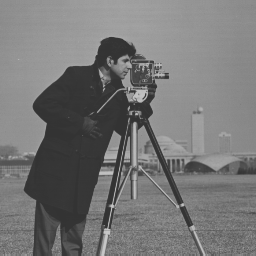

50 200


In [ ]:
#a
def linContrastStretching(img, a, b):
  img_float32 = img.astype(np.float32)
  #a normalização faz numeros entre 1 e 0, tambem evita estouro na multiplicação depois
  vmin = np.min(img_float32)
  vmax = np.max(img_float32)
  #pega os exrtemos da imagem, que definem o intervalo de origem da transformação
  ampl = vmax - vmin

  norm = (img_float32 - vmin)/ampl
  #normaliza, puxando tudo pra faixa do minimo e dividindo pela amplitude, comprimindo entre 0 e 1

  resc = norm*(b-a)+a
  #reescalona

  resc = np.round(resc)
  #arredonda o numero, ao inves de deixar truncado

  result = resc.astype(np.uint8)
  #volta pro tipo normal da imagem

  return result

img1r = linContrastStretching(img1, 50, 200)
img2r = linContrastStretching(img2, 50, 200)
img3r = linContrastStretching(img3, 50, 200)

cv2_imshow(img1r)
print(img1r.min(), img1r.max())
cv2_imshow(img2r)
print(img2r.min(), img2r.max())
cv2_imshow(img3r)
print(img3r.min(), img3r.max())


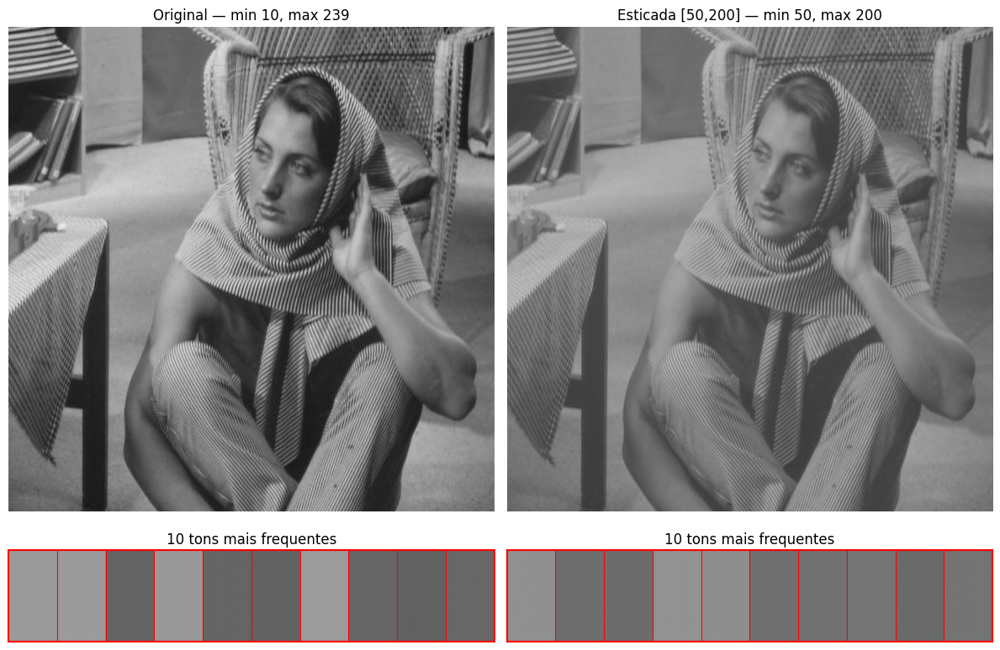

original: [154 155 100 153 101  99 156 102  98 103]
esticada: [144 110 108 146 142 112 114 117 106 116]


In [ ]:
#b
def barraCores(img, k):
  valores, cont = np.unique(img, return_counts=True)
  #tranforma os pixel em uma lista e atribui a contagem como na questao 1, mas sem axis pois é uma imagem grayscale
  ind = np.argsort(cont)
  #ordena as contagens, devolvendo o indice
  ind = ind[-k:][::-1]
  #pega um recorde do indice, pegando os k ultimos e inverte a ordem
  cores = valores[ind]
  #passa o array de indices e devolve os elementos daquelas posições

  barra = np.repeat(cores, (60,))
  #repete cada cor 60 vezes pra criar um bloco visivel
  barra = barra.reshape(1, -1)
  #transforma vetor em matriz de 1 linha
  barra = np.repeat(barra, 40, axis=0)
  #repete a linha 40 vezes pra ser visivel, por isso transformar o vetor em matriz, o axis define que a repetição é nas linhas

  return barra, cores

img = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/barbara.jpg', 0)
img_st = linContrastStretching(img, 50, 200)

barra1, cores1 = barraCores(img, 10)
barra2, cores2 = barraCores(img_st, 10)

fig, ax = plt.subplots(2, 2, figsize=(12, 8),
                       gridspec_kw={'height_ratios': [6, 1]})

ax[0][0].imshow(img, cmap='gray', vmin=0, vmax=255)
ax[0][0].set_title(f"Original — min {img.min()}, max {img.max()}")
ax[0][0].axis('off')

ax[0][1].imshow(img_st, cmap='gray', vmin=0, vmax=255)
ax[0][1].set_title(f"Esticada [50,200] — min {img_st.min()}, max {img_st.max()}")
ax[0][1].axis('off')

for eixo, barra in [(ax[1][0], barra1), (ax[1][1], barra2)]:
    eixo.imshow(barra, cmap='gray', vmin=0, vmax=255, aspect='auto')
    eixo.set_title("10 tons mais frequentes")
    eixo.set_xticks([])
    eixo.set_yticks([])
    for lado in eixo.spines.values():
        lado.set_visible(True)
        lado.set_edgecolor('red')
        lado.set_linewidth(1.5)
    for x in range(60, barra.shape[1], 60):
        eixo.axvline(x - 0.5, color='red', linewidth=0.8)

plt.tight_layout()
plt.show()

print("original:", cores1)
print("esticada:", cores2)

A barra de cores representa os 10 níveis de cinza mais frequentes, ordenados pela frequência em que aparecem na imagem, do mais comum ao menos comum (dentro dos 10). Os tons presentes nas barras estão apresentados logo abaixo, sendo possível perceber que, na imagem original, se concentram na faixa do 100 e 150 (intervalo de 58 niveis). Já na imagem esticada, os tons ficam mais próximos entre si (intervalo de 40 niveis), diminuindo o contraste.

A diminuição do contraste ocorre porque a faixa requisitada é menor que a da imagem, pois a imagem já possui uma amplitude alta, e tentando aumentar (para 0,255 por exemplo) a faixa fica quase idêntica. A função não realça por natureza, ela mapeia a faixa de entrada na faixa pedida e o efeito depende de qual é maior. O método sendo determinado por dois pixels, só olha os extremos, não percebendo a massa concentrada, por isso não corrige a concentração dos tons

In [ ]:
#c
imagens = [img1, img2, img3]
nomes = ['bellbw', 'clearbw', 'cameraman']

print(f"{'imagem':<12}{'min':>6}{'max':>6}{'ampl':>7}{'std':>8}{'std_eq':>9}{'ganho':>8}")
for nome, im in zip(nomes, imagens):
    vmin, vmax = im.min(), im.max()
    ampl = vmax - vmin
    st = linContrastStretching(im, 0, 255)
    print(f"{nome:<12}{vmin:>6}{vmax:>6}{ampl:>7}{im.std():>8.1f}{st.std():>9.1f}{st.std()/im.std():>8.2f}")

imagem         min   max   ampl     std   std_eq   ganho
bellbw          50   200    150    40.0     68.1    1.70
clearbw          0   255    255   101.9    101.9    1.00
cameraman        7   253    246    62.3     64.7    1.04


Chamando a função com 0 e 255, a conta será 255/amplitude, fazendo com que a função dependa completamente da amplitude da imagem para definir o ganho, logo, quanto menor a amplitude, maior o fator e o efeito fica mais visível.

Na tabela acima (colar na celula de texto desconfigura completamente), é possível ver que o ganho é inversamente proporcional a amplitude, qunto menor ela for, maior o ganho na imagem.

Como a amplitude é definida por apenas os dois pixels extremos, é muito fácil que, se a imagem é tem alguns pixels extremos, fica com vmin e vmax como 0 e 255 respectivamente, assim fazendo com que a função devolva uma imagem muito parecida, se não idêntica (como ocorre caso passe bellbw)

# 3. Transformação de Intensidade
a. Escreva uma função para gerar o negativo de uma imagem. A função deve receber a imagem e a
intensidade máxima como argumentos. Produza a saída transformada para as 8 primeiras formas
quantizadas em k bits de lena.jpg.  

b. Utilizando a imagem gamma-corr.png, aplique a Transformação Gama. Relate suas observações.

c. Escreva uma função para implementar uma transformação linear por partes. A função deve receber uma imagem de entrada, os coeficientes K1 e K2 e os intervalos a e b correspondentes a cada segmento linear, produzindo a imagem de saída
transformada. Produza as imagens transformadas de lena.jpg para as funções a seguir.

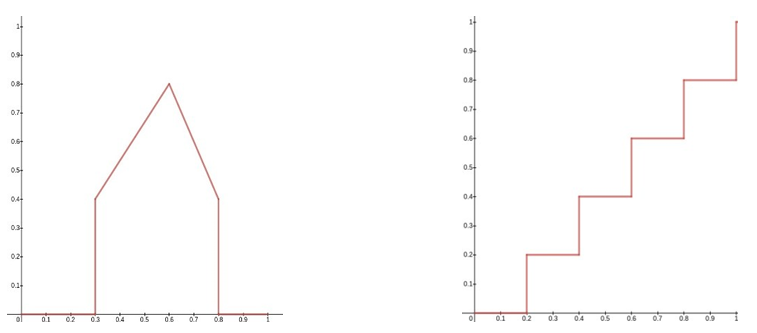

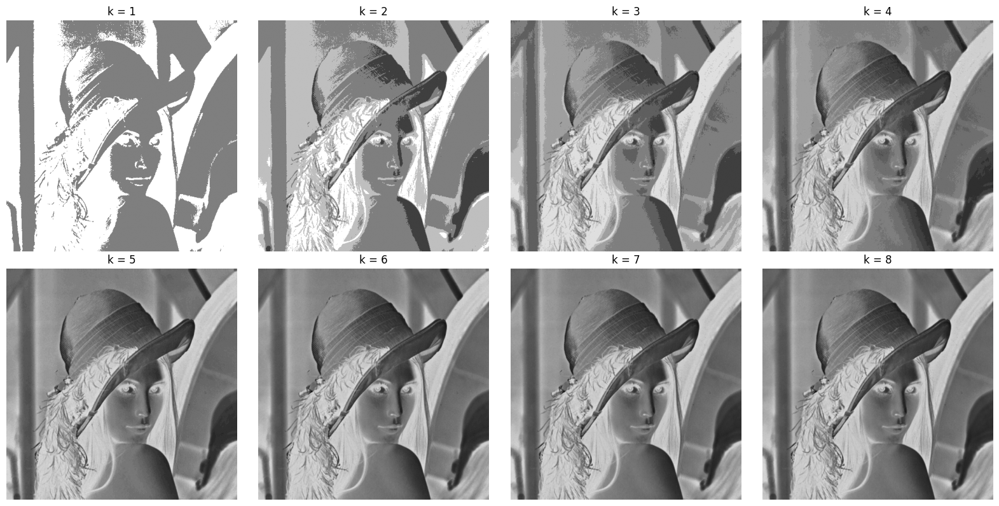

In [ ]:
#a
def negativo(img, max_intensidade):
  neg = (max_intensidade - img).astype(np.uint8)
  #inverte escala
  return neg

def quantiza (img, k):
  niveis = 2 ** k
  #quanto niveis distintos
  passo = 256 // niveis
  #quantos valores originais sao agrupados em cada nivel
  quant = (img // passo) * passo
  #divide e "arrendonda", depois multiplica para deixar a imagem visivel
  quant = quant.astype(np.uint8)
  return quant


resultados = []
img = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/lena.jpg', 0)

for k in range(1,9):
    q = quantiza(img, k)
    n = negativo(q, 255)
    resultados.append(n)

#for i in resultados:
#   cv2_imshow(i)

fig, ax = plt.subplots(2, 4, figsize=(16, 8))
ax = ax.flatten()
for eixo, imagem, k in zip(ax, resultados, range(1, 9)):
    eixo.imshow(imagem, cmap='gray', vmin=0, vmax=255)
    eixo.set_title(f"k = {k}")
    eixo.axis('off')
plt.tight_layout()
plt.show()

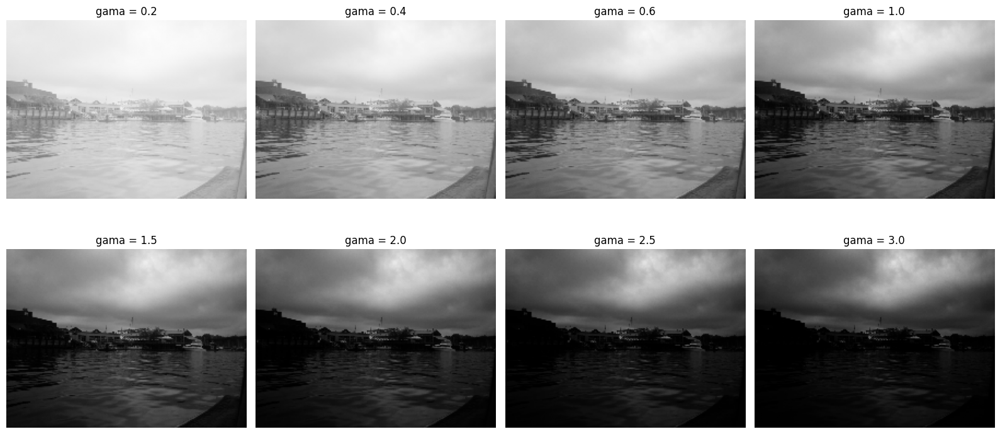

In [ ]:
#b
def gama(img, g):
  img_norm = img.astype(np.float32)/255
  #converte em float e normaliza (se nao normalizar os numeros ficam absurdos por ser pontencialização)
  img_gama = img_norm**g
  #aplica a potencia por elemento
  img_gama = (img_gama*255).round().astype(np.uint8)
  #reescala para exibição, arredonda para não truncar na conversão
  return img_gama

img = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/gamma-corr.png', 0)

gamas = [0.2, 0.4, 0.6, 1.0, 1.5, 2.0, 2.5, 3.0]
resultados_gama = []
for g in gamas:
    resultados_gama.append(gama(img, g))

fig, ax = plt.subplots(2, 4, figsize=(16, 8))
ax = ax.flatten()
for eixo, imagem, g in zip(ax, resultados_gama, gamas):
    eixo.imshow(imagem, cmap='gray', vmin=0, vmax=255)
    eixo.set_title(f"gama = {g}")
    eixo.axis('off')
plt.tight_layout()
plt.show()


Como fica evidente pelas imagens geradas, gama < 1 aumenta o brilho e > 1 escurece, isso acontece pois elevar um número menor que 1 a uma potência também menor que 1 aumenta seu valor, e uma potência maior que 1 diminui. Vale notar que os extremos são pontos fixos, 0 e 1, assim a operação nunca estoura a escala, pois é normalizado.

Como a operação é uma potencialização, não é linear, fazendo com que pontos mais proximos de 0 mudem muito mais do que pontos mais próximos de 1.

Vendo pela imagem de testes, com o gamba entre 1,5 e 2, é possível perceber que há detalhes mais destacados do que na original, como as nuvens, que eram chapadas e agora possuem estrutura. Ou seja, gama maior que 1 recupera detalhe em areas com muita exposição e menor que 1 recupera sombras

[  0   2   4   7   8  10  12  15  16  18  20  23  24  26  28  31  32  34
  36  39  40  42  44  47  48  50  52  55  56  58  60  63  64  66  68  71
  72  74  76  79  80  82  84  87  88  90  92  95  96  98 100 103 104 106
 108 111 112 114 116 119 120 122 124 127 128 130 132 135 136 138 140 143
 144 146 148 151 152 154 156 159 160 162 164 167 168 170 172 175 176 178
 180 183 184 186 188 191 192 194 196 197 199 200 202 204]


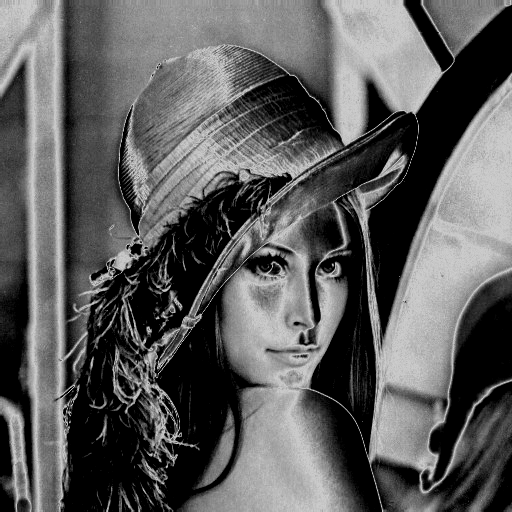

[ 51 102 153 204 255]


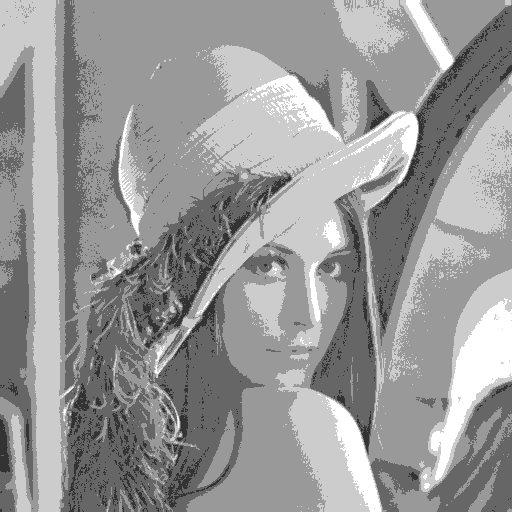

In [ ]:
#c
def linearPorPartes(img, K1, K2, A, B):
  img_norm = img.astype(np.float32)/255
  saida = np.zeros_like(img_norm)
  #cria array de destino com o mesmo shape da imagem, apenas com zeros

  for i in range(len(K1)):
    mascara = (img_norm >= A[i]) & (img_norm <= B[i])
    #marca os pixels que caem no intervalo do segmento atual
    saida[mascara] = K1[i] * img_norm[mascara] + K2[i]
    #aplica apenas nos pixels selecionados

  saida = np.clip(saida, 0, 1)
  #limita os valores em uma faixa, abaixo do minimo vira minimo e acima do maximo vira maximo
  saida = (saida * 255).round().astype(np.uint8)

  return saida

img = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/lena.jpg', 0)

#grafico 1
K1 = [0, 2.67, -4, 0]
K2 = [0, -0.8, 3.2, 0]
A  = [0.0, 0.3, 0.6, 0.8]
B  = [0.3, 0.6, 0.8, 1.0]

resultado1 = linearPorPartes(img, K1, K2, A, B)
print(np.unique(resultado1))
cv2_imshow(resultado1)

#grafico 2
K1 = [0, 0, 0, 0, 0]
K2 = [0.2, 0.4, 0.6, 0.8, 1.0]
A  = [0.0, 0.2, 0.4, 0.6, 0.8]
B  = [0.2, 0.4, 0.6, 0.8, 1.0]

resultado2 = linearPorPartes(img, K1, K2, A, B)
print(np.unique(resultado2))
cv2_imshow(resultado2)


# 4. Equalização e Correspondência de Histogramas
a. Escreva uma função denominada histEqualization que receba uma imagem em tons de cinza im
e aplique a equalização do histograma à imagem inteira.  
b. Exiba a imagem de entrada e a imagem resultante lado a lado e apresente uma explicação
adequada para as alterações observadas em múltiplas imagens de entrada.  
c. Escreva uma função denominada histMatching que receba uma imagem de entrada e uma
imagem de referência e aplique a correspondência de histogramas à imagem de entrada, fazendo
com que seu histograma corresponda ao histograma da imagem de referência. Utilize eye.png e
eyeref.png (convertidas para tons de cinza) como imagens de entrada e de referência,
respectivamente.  
d. São fornecidas quatro imagens (part1.png, part2.png, part3.png e part4.png), com diferentes
níveis de contraste, correspondentes aos quatro quadrantes de canyon.png, conforme
apresentado na Figura 5. Recupere, da forma mais aproximada possível, a imagem original,
convertida para tons de cinza, utilizando essas quatro imagens, também convertidas para tons de
cinza.

In [ ]:
#a
def histEqualization(img):
  hist, bins = np.histogram(img, 256, [0,256])
  #conta quantos pixels tem em cada nivel de cinza, para não ocorrer erros de mapeamento
  cdf = hist.cumsum()
  #soma acumulada do histograma, crescente e sobre mais rápido ontem tem mais pixels
  cdf_normalized = np.round((cdf / cdf.max())*255)
  #normaliza e reescala
  cdf_normalized = cdf_normalized.astype(np.uint8)
  return cdf_normalized[img]

img = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/lena.jpg', 0)

eq = histEqualization(img)
print(eq.min(), eq.max())
print(img.mean(), eq.mean())

0 255
125.16407775878906 128.35919570922852


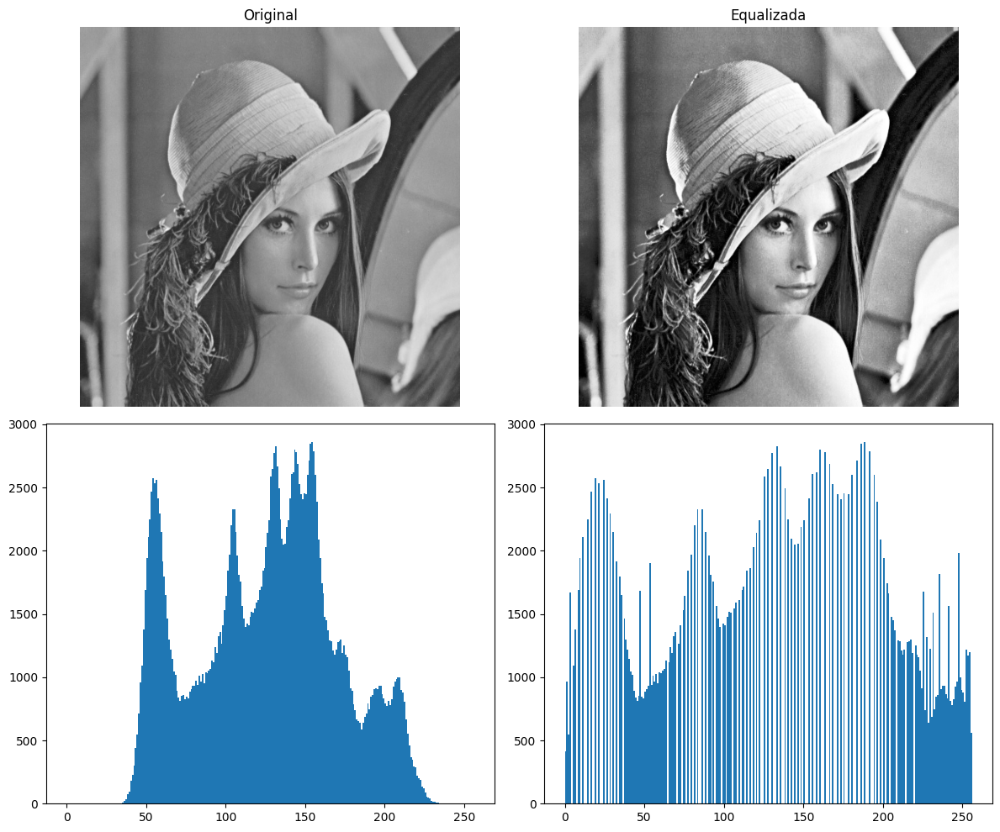

In [ ]:
#b
fig, ax = plt.subplots(2, 2, figsize=(12, 10))
ax[0][0].imshow(img, cmap='gray', vmin=0, vmax=255)
ax[0][0].set_title("Original")
ax[0][0].axis('off')

ax[0][1].imshow(eq, cmap='gray', vmin=0, vmax=255)
ax[0][1].set_title("Equalizada")
ax[0][1].axis('off')
ax[1][0].hist(img.ravel(), 256, range=[0, 256])
ax[1][1].hist(eq.ravel(), 256, range=[0, 256])
plt.tight_layout()
plt.show()

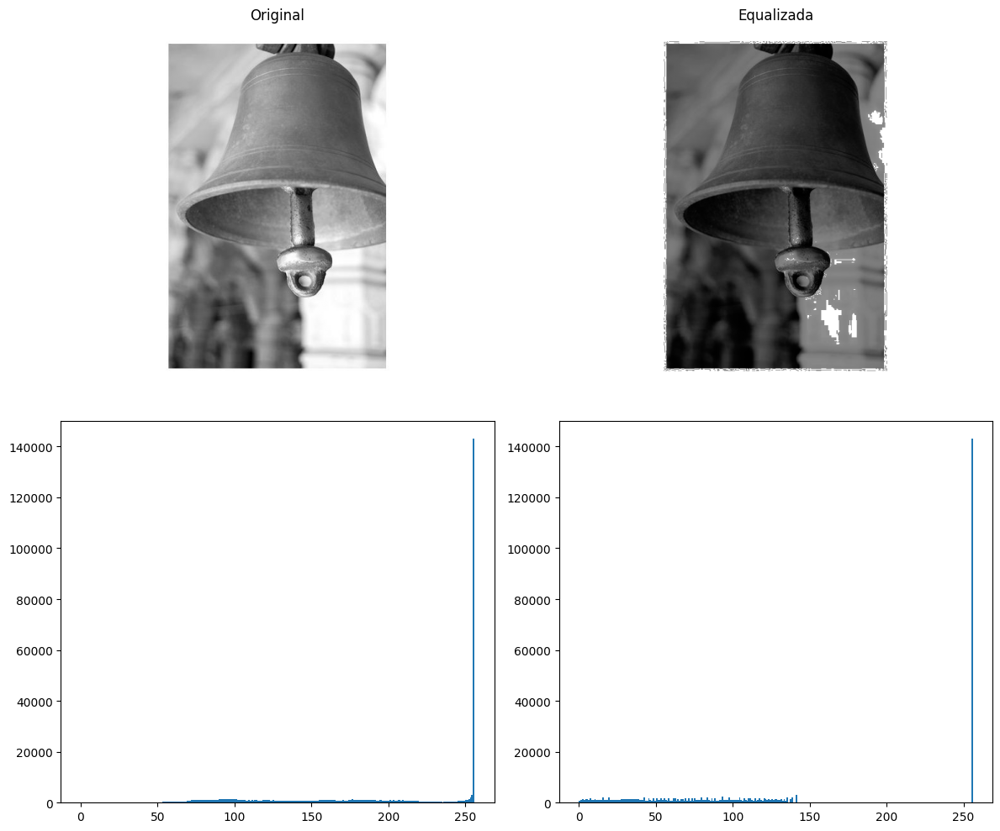

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/bellbw.jpg', 0)
eq = histEqualization(img)

fig, ax = plt.subplots(2, 2, figsize=(12, 10))
ax[0][0].imshow(img, cmap='gray', vmin=0, vmax=255)
ax[0][0].set_title("Original")
ax[0][0].axis('off')

ax[0][1].imshow(eq, cmap='gray', vmin=0, vmax=255)
ax[0][1].set_title("Equalizada")
ax[0][1].axis('off')
ax[1][0].hist(img.ravel(), 256, range=[0, 256])
ax[1][1].hist(eq.ravel(), 256, range=[0, 256])
plt.tight_layout()
plt.show()

A CDF é usada como função de transferência, sobe onde há muitos pixels e fica horizontal onde há poucos, logo, niveis populosos são mapeados distantes entre eles, e os níveis menos populosos ficam mais próximos.

No caso da imagem da lena, o histograma estava comprimido entre 30 e 220, e, após passar a função, ficou mais espaçado, ocupando de 0 a 255. A mudança visual na imagem é, principalmente, o chapéu mais destacado do fundo.

No caso do bellbw, há um pico de 140 mil pixels em 255, o fundo branco, que não se move depois da função, pois não pode ser dividido, todos vão para o mesmo destino, ao contrário do resto dos pixels, que foram comprimidos, escurecendo a imagem e deixando uma aparência "suja" nela.

A discretização deixa essas barras altas e com vazios entre elas, isso ocorre porque é a CDF do resultado que fica reta, como mostra a próxima celula.

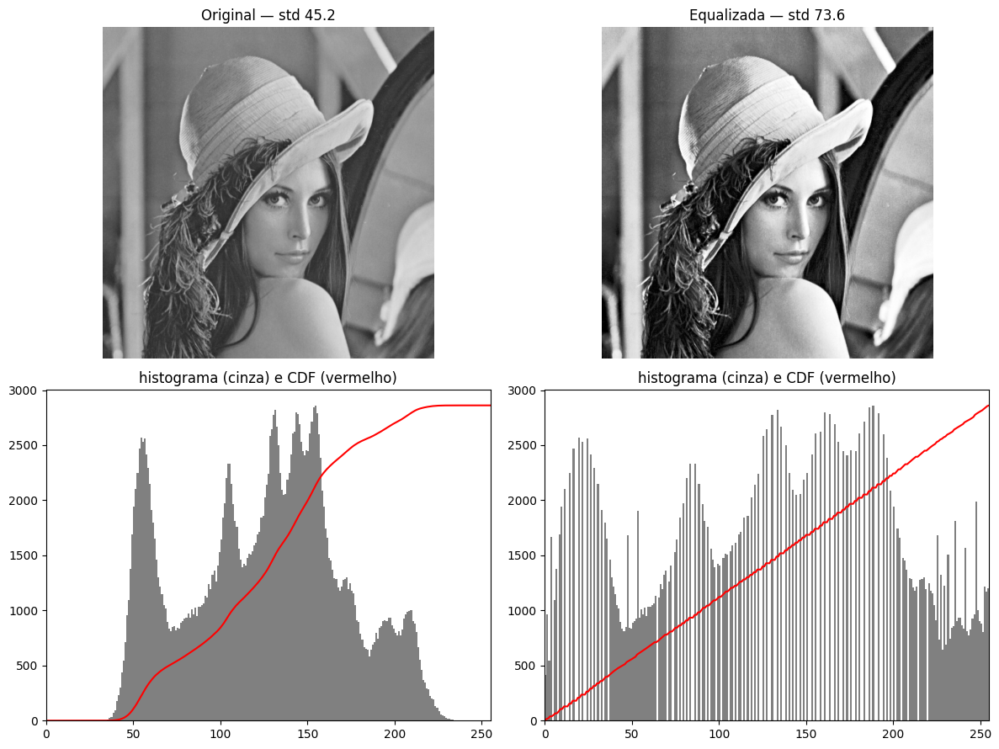

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/lena.jpg', 0)
eq = histEqualization(img)

fig, ax = plt.subplots(2, 2, figsize=(12, 9))

for col, (im, titulo) in enumerate([(img, "Original"), (eq, "Equalizada")]):
    ax[0][col].imshow(im, cmap='gray', vmin=0, vmax=255)
    ax[0][col].set_title(f"{titulo} — std {im.std():.1f}")
    ax[0][col].axis('off')

    hist, _ = np.histogram(im, 256, [0, 256])
    cdf = hist.cumsum()
    cdf_esc = cdf * hist.max() / cdf.max()

    ax[1][col].hist(im.ravel(), 256, range=[0, 256], color='gray')
    ax[1][col].plot(cdf_esc, color='red', linewidth=1.5)
    ax[1][col].set_xlim(0, 255)
    ax[1][col].set_title("histograma (cinza) e CDF (vermelho)")

plt.tight_layout()
plt.show()

True
0 234 89.8236


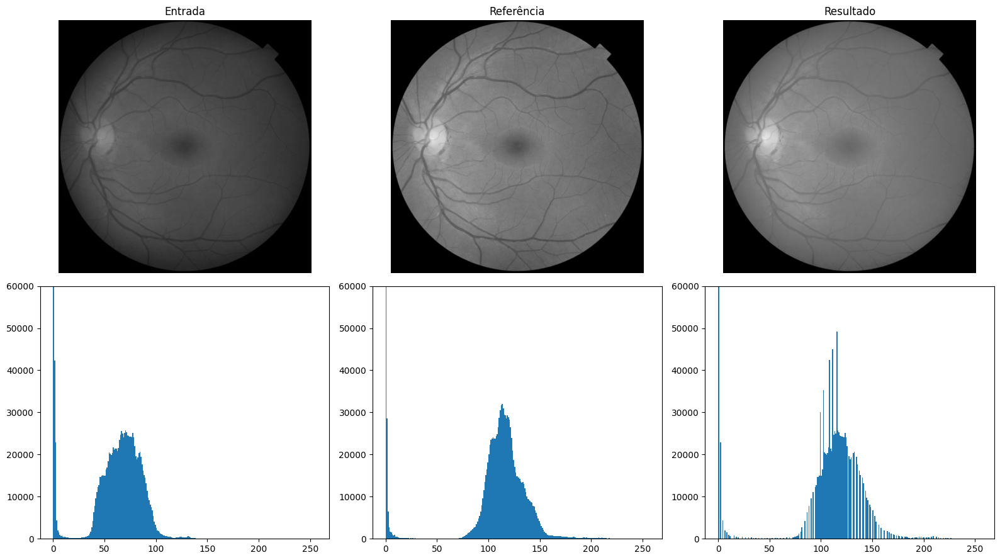

In [ ]:
#c
def histMatching(img, ref):
  hist_img, bins_img = np.histogram(img, 256, [0,256])
  hist_ref, bins_ref = np.histogram(ref, 256, [0,256])

  cdf_img = hist_img.cumsum()
  cdf_img = cdf_img / cdf_img.max()
  cdf_ref = hist_ref.cumsum()
  cdf_ref = cdf_ref / cdf_ref.max()

  tabela = np.zeros(256)

  for i in range(256):
    tabela[i] = np.argmin(np.abs(cdf_ref - cdf_img[i]))
    #calcula a diferença da proporção acumulada e todos os 256 valores da cdf de referencia

  tabela = tabela.astype(np.uint8)
  return tabela[img]

print(np.array_equal(img, histMatching(img, img)))

eye = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/eye.png', 0)
eyeref = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/eyeref.png', 0)
resultado = histMatching(eye, eyeref)

print(resultado.min(), resultado.max(), resultado.mean())

fig, ax = plt.subplots(2, 3, figsize=(16, 9))

ax[0][0].imshow(eye, cmap='gray', vmin=0, vmax=255)
ax[0][0].set_title("Entrada")
ax[0][0].axis('off')

ax[0][1].imshow(eyeref, cmap='gray', vmin=0, vmax=255)
ax[0][1].set_title("Referência")
ax[0][1].axis('off')

ax[0][2].imshow(resultado, cmap='gray', vmin=0, vmax=255)
ax[0][2].set_title("Resultado")
ax[0][2].axis('off')

ax[1][0].hist(eye.ravel(), 256, range=[0, 256])
ax[1][0].set_ylim(0, 60000)

ax[1][1].hist(eyeref.ravel(), 256, range=[0, 256])
ax[1][1].set_ylim(0, 60000)

ax[1][2].hist(resultado.ravel(), 256, range=[0, 256])
ax[1][2].set_ylim(0, 60000)

plt.tight_layout()
plt.show()

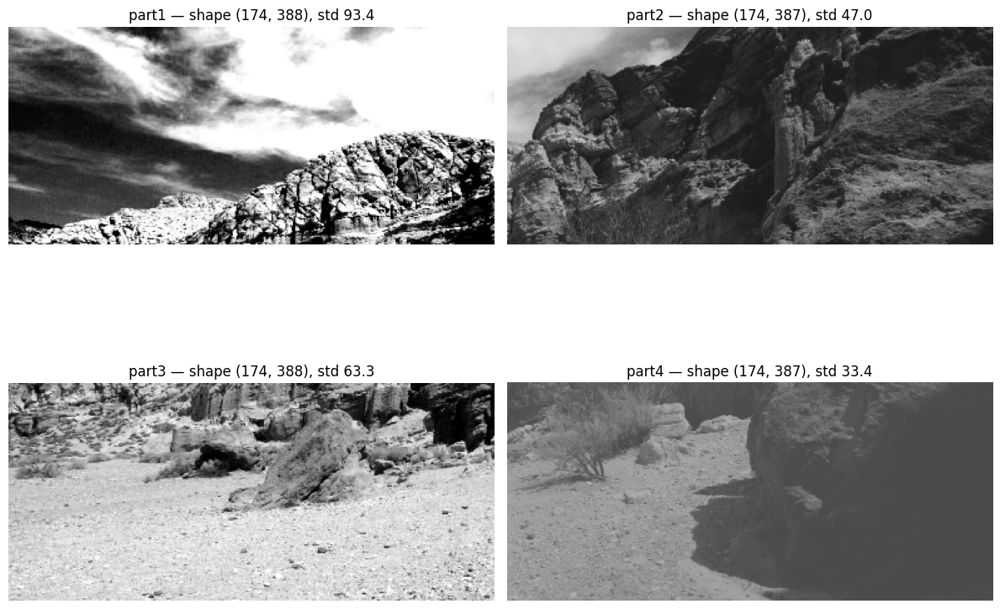

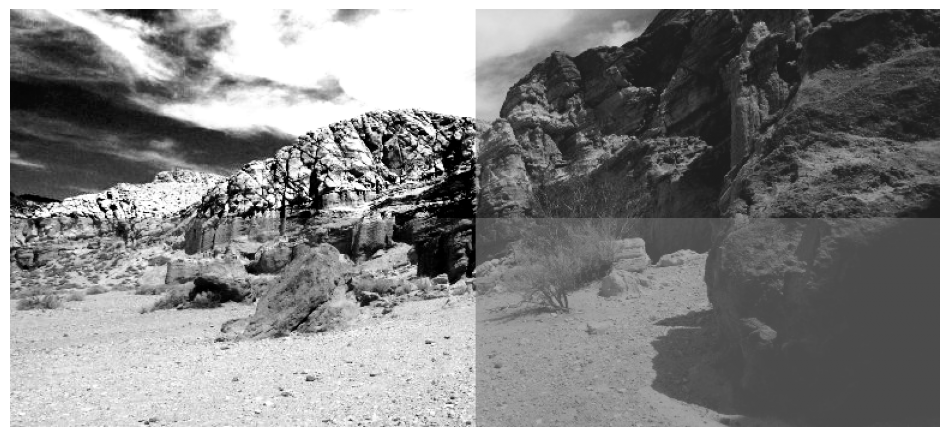

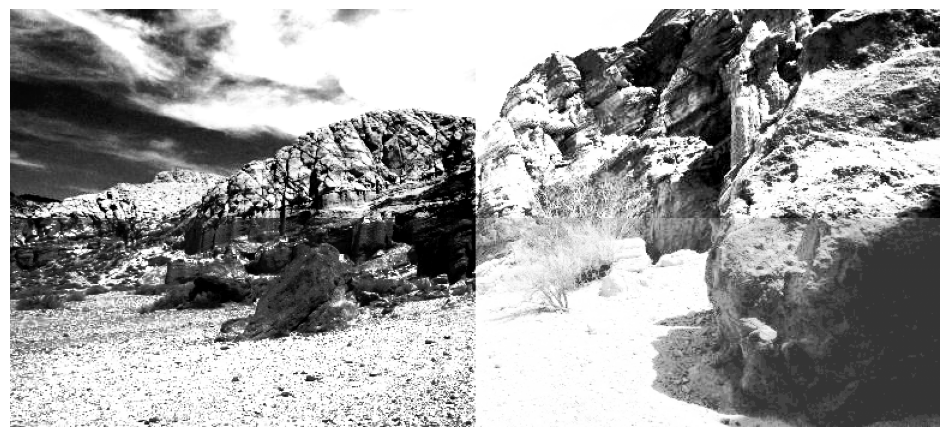

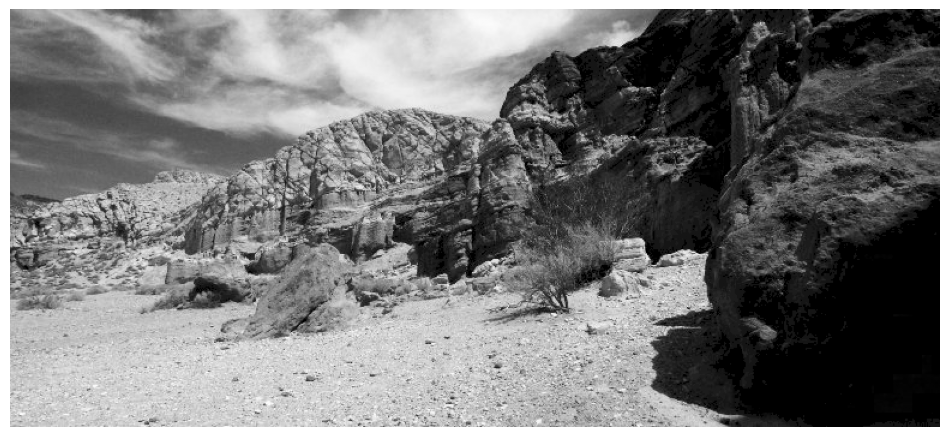

28.37803856136448 64.38874675565444


In [ ]:
part1 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/part1.png', 0)
part2 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/part2.png', 0)
part3 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/part3.png', 0)
part4 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/part4.png', 0)

partes = [part1, part2, part3, part4]
nomes = ['part1', 'part2', 'part3', 'part4']

fig, ax = plt.subplots(2, 2, figsize=(12, 10))
ax = ax.flatten()
for eixo, p, nome in zip(ax, partes, nomes):
    eixo.imshow(p, cmap='gray', vmin=0, vmax=255)
    eixo.set_title(f"{nome} — shape {p.shape}, std {p.std():.1f}")
    eixo.axis('off')
plt.tight_layout()
plt.show()

linha_cima = np.hstack([part1, part2])
linha_baixo = np.hstack([part3, part4])
canyon_antes = np.vstack([linha_cima, linha_baixo])

plt.figure(figsize=(12, 6))
plt.imshow(canyon_antes, cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.show()

part2 = histMatching(part2, part1)
part3 = histMatching(part3, part1)
part4 = histMatching(part4, part1)

linha_cima = np.hstack([part1, part2])
linha_baixo = np.hstack([part3, part4])
canyon_depois = np.vstack([linha_cima, linha_baixo])

plt.figure(figsize=(12, 6))
plt.imshow(canyon_depois, cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.show()

original = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/canyon.png', 0)

plt.figure(figsize=(12, 6))
plt.imshow(original, cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.show()

erro_sem = np.abs(canyon_antes.astype(np.int16) - original.astype(np.int16)).mean()
erro_com = np.abs(canyon_depois.astype(np.int16) - original.astype(np.int16)).mean()
print(erro_sem, erro_com)

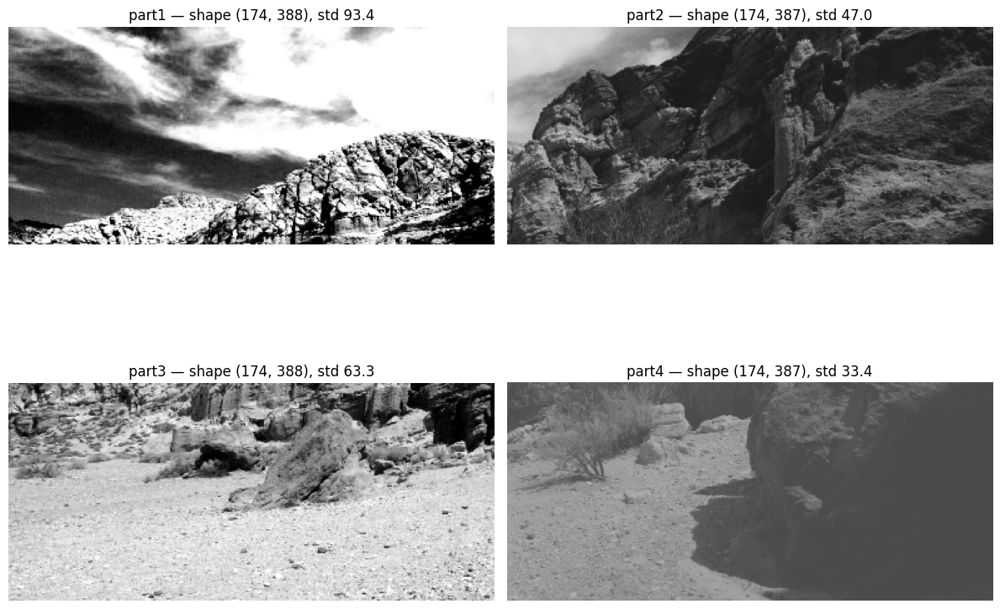

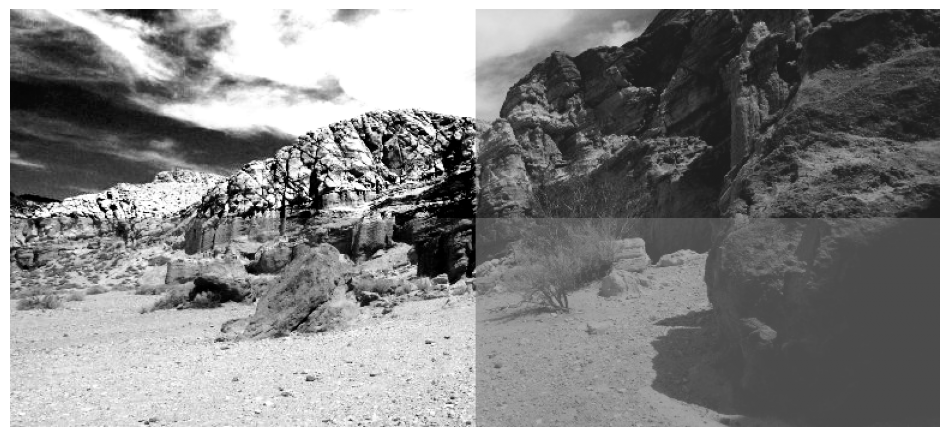

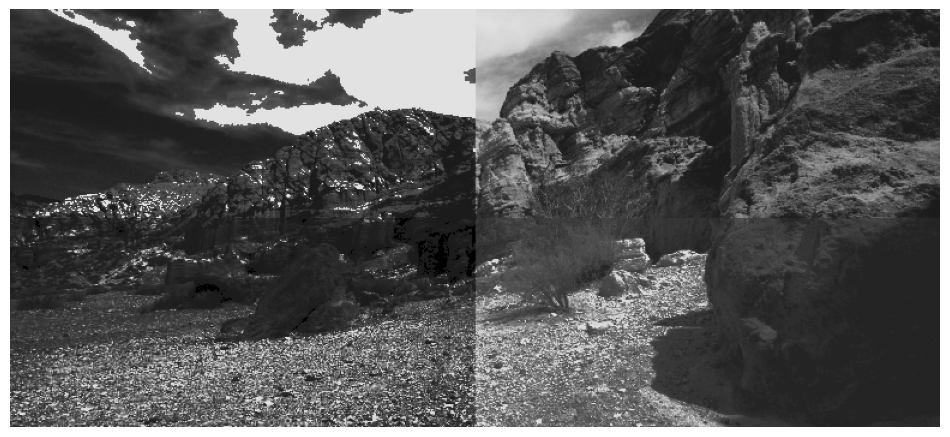

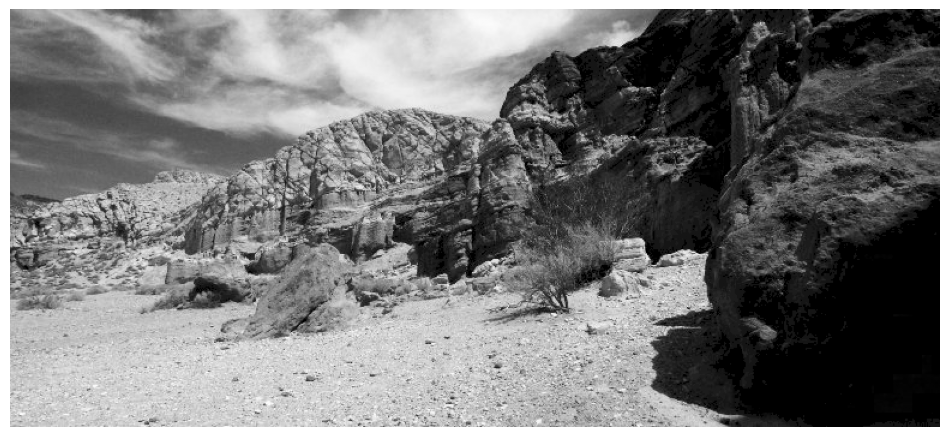

28.37803856136448 50.10216536892844


In [ ]:
part1 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/part1.png', 0)
part2 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/part2.png', 0)
part3 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/part3.png', 0)
part4 = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/part4.png', 0)

partes = [part1, part2, part3, part4]
nomes = ['part1', 'part2', 'part3', 'part4']

fig, ax = plt.subplots(2, 2, figsize=(12, 10))
ax = ax.flatten()
for eixo, p, nome in zip(ax, partes, nomes):
    eixo.imshow(p, cmap='gray', vmin=0, vmax=255)
    eixo.set_title(f"{nome} — shape {p.shape}, std {p.std():.1f}")
    eixo.axis('off')
plt.tight_layout()
plt.show()

linha_cima = np.hstack([part1, part2])
linha_baixo = np.hstack([part3, part4])
canyon_antes = np.vstack([linha_cima, linha_baixo])

plt.figure(figsize=(12, 6))
plt.imshow(canyon_antes, cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.show()

part1m = histMatching(part1, part2)
part3m = histMatching(part3, part2)
part4m = histMatching(part4, part2)

linha_cima = np.hstack([part1m, part2])
linha_baixo = np.hstack([part3m, part4m])
canyon_depois = np.vstack([linha_cima, linha_baixo])

plt.figure(figsize=(12, 6))
plt.imshow(canyon_depois, cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.show()

original = cv2.imread('/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/canyon.png', 0)

plt.figure(figsize=(12, 6))
plt.imshow(original, cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.show()

erro_sem = np.abs(canyon_antes.astype(np.int16) - original.astype(np.int16)).mean()
erro_com = np.abs(canyon_depois.astype(np.int16) - original.astype(np.int16)).mean()
print(erro_sem, erro_com)

# 5. Demonstre que a subtração do Laplaciano de uma imagem é proporcional à técnica de mascaramento de nitidez (unsharp masking).
Use as técnicas de processamento vistas em aula e demonstre
empiricamente.

(512, 512)


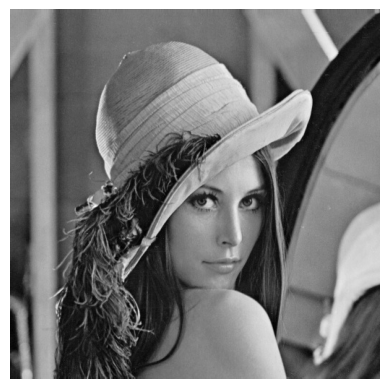

In [6]:
imagem = Image.open("/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/lena.jpg").convert("L")
imagem = np.array(imagem, dtype=float)

print(imagem.shape)

plt.imshow(imagem, cmap="gray")
plt.axis("off")
plt.show()

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
def laplaciano(imagem): #função que faz o calculo laplaciano que passa o kernel pela imagem.
    altura, largura = imagem.shape
    resultado = np.zeros_like(imagem, dtype=float)

    for i in range(1, altura -1):
        for j in range(1, largura -1):

            resultado[i, j] = ( #resultado da função laplaciana procura por pixeis nas 4 direções
                imagem[i + 1, j] +
                imagem[i - 1, j] +
                imagem[i, j + 1] +
                imagem[i, j - 1] -
                4 * imagem[i, j] # soma os quatro vizinhos e subtrai 4 vezes o pixel central,
                                 # conforme a definição discreta do Laplaciano
            )

    return resultado

In [8]:
def suavizar_vizinhos(imagem): #Mesmo medelo laplaciano, mas suavizando o pixel.
    altura, largura = imagem.shape
    resultado = np.zeros_like(imagem, dtype=float)

    for i in range(1, altura -1):
        for j in range(1, largura -1):

            resultado[i, j] = (
                imagem[i + 1, j] +
                imagem[i - 1, j] +
                imagem[i, j + 1] +
                imagem[i, j - 1] +
                imagem[i, j]
            ) / 5

    return resultado

In [9]:
lap = laplaciano(imagem)
suavizada = suavizar_vizinhos(imagem)
mascara = imagem - suavizada #A mascará é definida pela diferença entre a imagem suavizada e a imagem original

resultado_laplaciano = imagem - lap #subtração do laplaciano
resultado_unsharp = imagem + mascara #resultado do Unsharp Masking

resultado_unsharp_k5 = imagem + 5 * mascara

#resultado_lap = np.clip(resultado_lap, 0, 255)

#plt.imshow(resultado_lap, cmap="gray")
#plt.axis("off")
#plt.show()

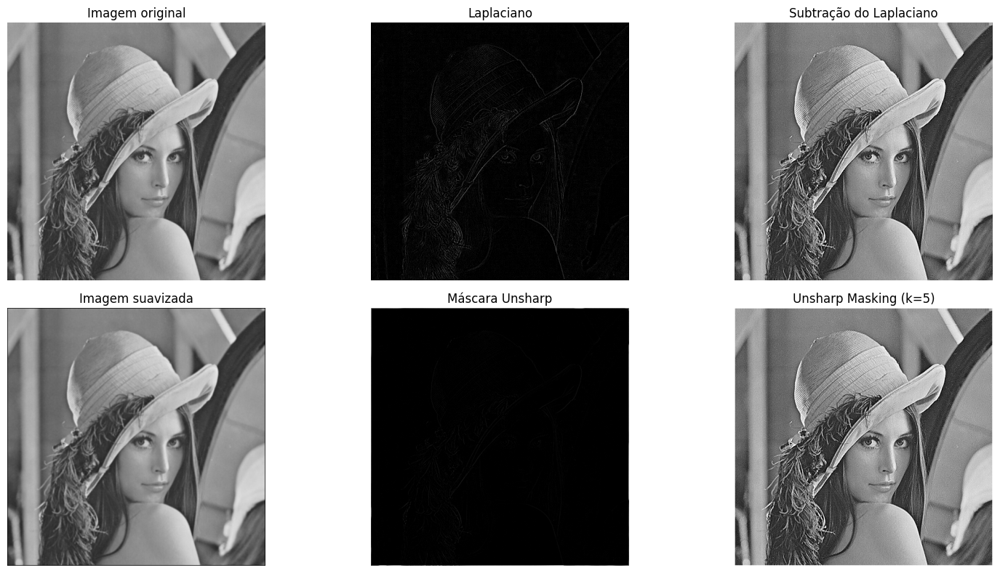

Original:
mínimo: 34.0
máximo: 245.0

Subtração do Laplaciano:
mínimo: 0.0
máximo: 255.0

Unsharp k=5:
mínimo: 0.0
máximo: 255.0
Erro médio entre os resultados: 2.4078247192229733e-14
Erro máximo entre os resultados: 5.684341886080802e-14


In [10]:
plt.figure(figsize=(16, 8))

plt.subplot(2, 3, 1)
plt.imshow(imagem, cmap="gray", vmin=0, vmax=255)
plt.title("Imagem original")
plt.axis("off")

plt.subplot(2, 3, 2)
plt.imshow(lap, cmap="gray", vmin=0, vmax=255)
plt.title("Laplaciano")
plt.axis("off")

plt.subplot(2, 3, 3)
plt.imshow(resultado_laplaciano, cmap="gray",  vmin=0, vmax=255)
plt.title("Subtração do Laplaciano")
plt.axis("off")

plt.subplot(2, 3, 4)
plt.imshow(suavizada, cmap="gray",  vmin=0, vmax=255)
plt.title("Imagem suavizada")
plt.axis("off")

plt.subplot(2, 3, 5)
plt.imshow(mascara, cmap="gray",  vmin=0, vmax=255)
plt.title("Máscara Unsharp")
plt.axis("off")

plt.subplot(2, 3, 6)
plt.imshow(resultado_unsharp_k5, cmap="gray", vmin=0, vmax=255)
plt.title("Unsharp Masking (k=5)")
plt.axis("off")

plt.tight_layout()
plt.show()

resultado_laplaciano_img = np.clip(
    resultado_laplaciano, 0, 255
)

resultado_unsharp_k5_img = np.clip(
    resultado_unsharp_k5, 0, 255
)

erro_resultados = np.abs(
    resultado_laplaciano_img[1:-1, 1:-1]
    - resultado_unsharp_k5_img[1:-1, 1:-1]
)

print("Original:")
print("mínimo:", imagem.min())
print("máximo:", imagem.max())

print("\nSubtração do Laplaciano:")
print("mínimo:", resultado_laplaciano_img.min())
print("máximo:", resultado_laplaciano_img.max())

print("\nUnsharp k=5:")
print("mínimo:", resultado_unsharp_k5_img.min())
print("máximo:", resultado_unsharp_k5_img.max())

print("Erro médio entre os resultados:",
      erro_resultados.mean())

print("Erro máximo entre os resultados:",
      erro_resultados.max())

# 6. Crie uma matriz de dimensão 3×3 que, ao ser convoluída com box.png, produza uma linha branca na região de transição entre o branco e o preto.  
a. Faça a convolução de blur.jpg com a matriz acima e com a transposta dessa matriz. Relate suas
observações.  
b. Repita os procedimentos anteriores utilizando imagens adequadas de sua escolha.

(520, 526)


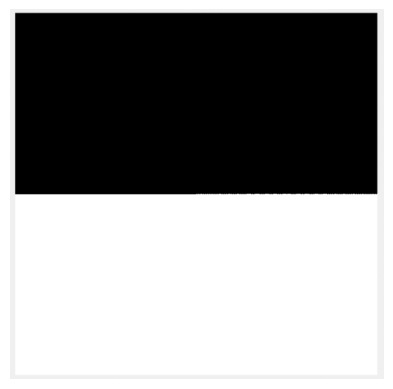

In [12]:
imagem = Image.open("/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/box.png").convert("L")
imagem = np.array(imagem, dtype="float")

print(imagem.shape)

plt.imshow(imagem, cmap="gray")
plt.axis("off")
plt.show()

In [13]:
def convolucao(imagem, kernel):
    altura, largura = imagem.shape
    resultado = np.zeros_like(imagem, dtype=float)

    for i in range(1, altura - 1):
        for j in range(1, largura - 1):

            regiao = imagem[
                i - 1:i + 2,
                j - 1:j + 2
            ]

            resultado[i, j] = np.sum(regiao * kernel)

    return resultado

In [14]:
kernel = np.array([
    [-1, -1, -1],
    [ 0,  0,  0],
    [ 1,  1,  1]
], dtype=float)

In [15]:
resultado = convolucao(imagem, kernel)

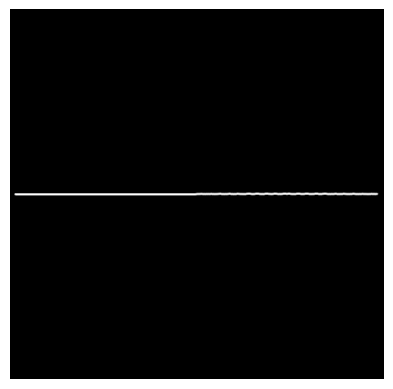

In [16]:
plt.imshow(resultado, cmap="gray", vmin=0, vmax=255)
plt.axis("off")
plt.show()

In [17]:
def convolucao(imagem, kernel):
    altura, largura = imagem.shape
    resultado = np.zeros_like(imagem, dtype=float)

    kernel = np.rot90(kernel, 2)

    for i in range(1, altura - 1):
        for j in range(1, largura - 1):

            regiao = imagem[
                i - 1:i + 2,
                j - 1:j + 2
            ]

            resultado[i, j] = np.sum(regiao * kernel)

    return resultado

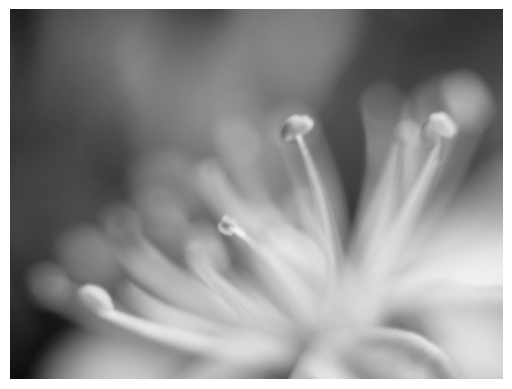

In [18]:
blur = Image.open("/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/blur.jpg").convert("L")
blur = np.array(blur, dtype=float)

plt.imshow(blur, cmap="gray", vmin=0, vmax=255)
plt.axis("off")
plt.show()

In [19]:
kernel = np.array([
    [1, 1, 1],
    [0, 0, 0],
    [-1, -1, -1]
], dtype=float)

In [26]:
resultado_kernel = convolucao(cameramen, kernel)

In [25]:
kernel_transposta = kernel.T

resultado_transposta = convolucao(cameramen, kernel_transposta)

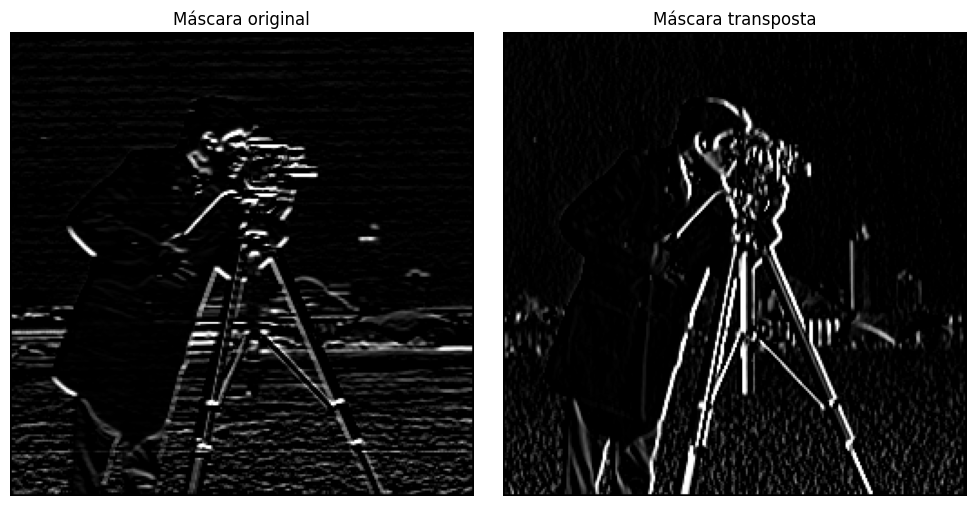

In [27]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].imshow(resultado_kernel, cmap="gray", vmin=0, vmax=255)
ax[0].set_title("Máscara original")

ax[1].imshow(resultado_transposta, cmap="gray", vmin=0, vmax=255)
ax[1].set_title("Máscara transposta")

for a in ax:
    a.axis("off")

plt.tight_layout()
plt.show()

In [23]:
#podemos observar que a máscara original realça com a transição de borda vindo da vertical
# E a transposta realça com a borda vindo na horizontal
# Isso nos leva a uma impressão de que, dependendo da direçnao do kernel, a "iluminação da foto fica num angulo diferente"

(256, 256)


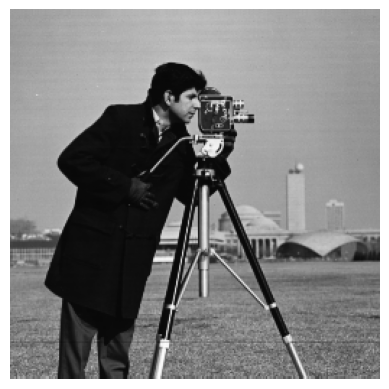

In [22]:
cameramen = Image.open("/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/cameraman.png").convert("L")
cameramen = np.array(cameramen, dtype=float)

print(cameramen.shape)

plt.imshow(cameramen, cmap="gray", vmin=0, vmax=255)
plt.axis("off")
plt.show()

In [28]:
resultado_cameramen = convolucao(cameramen, kernel)
resultado_cameramen_transposta = convolucao(cameramen, kernel.T)

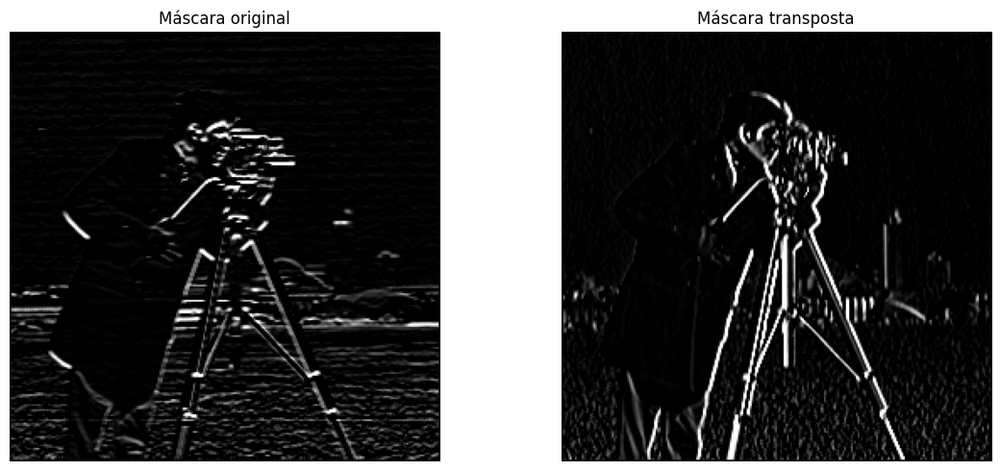

In [29]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

ax[0].imshow(
    resultado_cameramen,
    cmap="gray",
    vmin=0,
    vmax=255
)
ax[0].set_title("Máscara original")

ax[1].imshow(
    resultado_cameramen_transposta,
    cmap="gray",
    vmin=0,
    vmax=255
)
ax[1].set_title("Máscara transposta")

for a in ax:
    a.axis("off")

plt.tight_layout()
plt.show()

In [30]:
# Da mesma forma que a imagem "blur" nos trouxe diferentes maneiras de observar a mesma composição de borda da imagem.
# aqui podemos observar a diferença entre utilizar a máscara em diferentes orientações. Nos auxiliando a montar imagens
# Mais agradáveis de se observar

# 7. A implementação de filtros espaciais lineares requer o deslocamento de uma máscara, centralizada em cada pixel da imagem, calculando-se a soma dosprodutos entre os coeficientes da máscara e os pixels correspondentes.
a. Implemente um algoritmo para filtragem passa-baixas de uma imagem em tons de cinza,
deslocando um filtro de média k×k na forma ones(k)/(k²).  
b. À medida que o filtro é deslocado de uma posição espacial para a seguinte, a janela do filtro
compartilha muitos pixels com as vizinhanças adjacentes. Explore essa característica e
implemente uma versão mais eficiente do filtro de média. Para avaliar os benefícios dessa
abordagem, gere um gráfico de k em função do tempo de execução para imagens de diferentes
dimensões. O gráfico deve conter uma curva para cada dimensão de imagem escolhida. Utilize
diferentes tipos de marcadores para distinguir a implementação padrão da implementação
otimizada. Como referência, consulte a figura disponível em https://imgur.com/a/0HtYlTE .  
c. Utilize uma observação semelhante à anterior para implementar uma versão eficiente de um filtro
de mediana k×k. Gere uma figura com gráfico semelhante ao da questão anterior.

In [31]:
cameramen = Image.open("/content/drive/MyDrive/Imagens/Imagens Faculdade/PDI/cameraman.png").convert("L")
cameramen = np.array(cameramen, dtype=float)

In [32]:
def filtro_media(imagem, k): # Filtro de média
    altura, largura = imagem.shape
    resultado = np.zeros_like(imagem, dtype=float)

    raio = k // 2

    imagem_pad = np.pad(
    imagem,
    ((raio, raio), (raio, raio)),
    mode="edge"
    )

    for i in range(raio, altura - raio): # Rodamos a imagem inteira utilizando o Kernel de média que criamos para poderoms fazer uma média dos pixeis
        for j in range(raio, largura - raio):

            janela = imagem[
                i - raio:i + raio + 1,
                j - raio:j + raio + 1
            ]

            resultado[i, j] = np.sum(janela) / (k * k)

    return resultado

In [33]:
resultado_media = filtro_media(cameramen, 3)

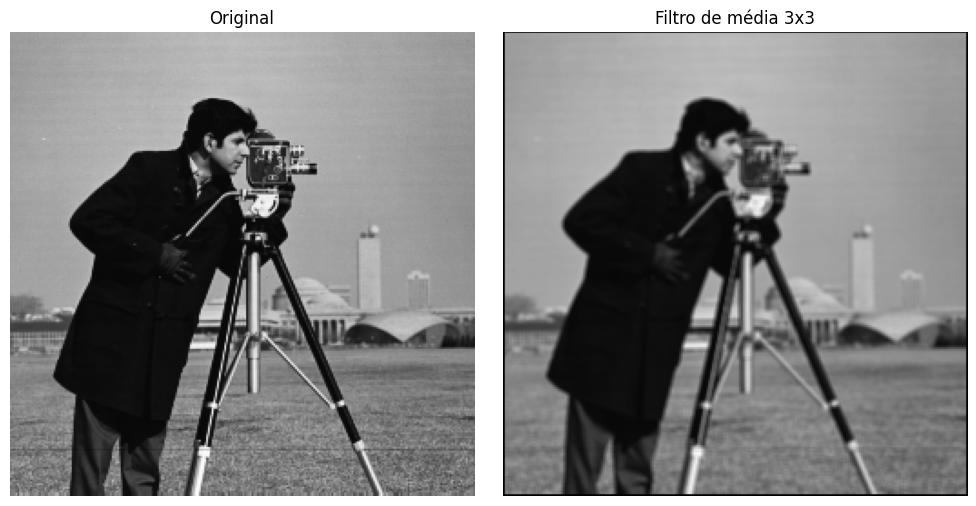

In [34]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cameramen, cmap="gray", vmin=0, vmax=255)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(resultado_media, cmap="gray", vmin=0, vmax=255)
plt.title("Filtro de média 3x3")
plt.axis("off")

plt.tight_layout()
plt.show() # Podemos observar que o filtro de média cria uma imagem "Borrada" e quanto maior o valor de K, mais "borrado" a imagem pois o kernel vai estar fazendo a média de uma área maior.

In [38]:
import time

In [39]:
inicio = time.perf_counter()

resultado_media = filtro_media(cameramen, 3)

fim = time.perf_counter()

print("Tempo:", fim - inicio, "segundos") # Verificando o tempo de execução para depois medir eficiência

Tempo: 0.2372547840000152 segundos


In [40]:
def filtro_media_otimizado(imagem, k): # Versão otimizada do nosso filtro de média.
    altura, largura = imagem.shape
    resultado = np.zeros_like(imagem, dtype=float)

    raio = k // 2

    imagem_pad = np.pad(
    imagem,
    ((raio, raio), (raio, raio)),
    mode="edge"
    )

    for i in range(raio, altura - raio):

        # Ao invés de fazermos o cálculo de média todas as vezes, nós apenas subtraimos a coluna inicial e adicionamos a coluna inicial
        soma_colunas = np.sum(
            imagem[i - raio:i + raio + 1, :],
            axis=0
        )

        soma = np.sum(soma_colunas[:k])

        resultado[i, raio] = soma / (k * k)

        for j in range(raio + 1, largura - raio):

            soma -= soma_colunas[j - raio - 1]
            soma += soma_colunas[j + raio]

            resultado[i, j] = soma / (k * k)

    return resultado

In [41]:
resultado_normal = filtro_media(cameramen, 5)
resultado_otimizado = filtro_media_otimizado(cameramen, 5)
# Verificando se os dois tipos de filtros criados estão matematicamente próximos.
print(
    "Erro médio:",
    np.abs(resultado_normal - resultado_otimizado).mean()
)

print(
    "Erro máximo:",
    np.abs(resultado_normal - resultado_otimizado).max()
)

print(
    "São iguais?",
    np.allclose(resultado_normal, resultado_otimizado)
)

Erro médio: 0.0
Erro máximo: 0.0
São iguais? True


In [42]:
resultado_normal = filtro_media(cameramen, 5)
resultado_otimizado = filtro_media_otimizado(cameramen, 5)

# Verificamos se a nossa versão otimizada é mais eficiênte em fazer um output mais rápido (o que foi verdadeiro)

inicio = time.perf_counter()

filtro_media(cameramen, 5)

fim = time.perf_counter()

tempo_normal = fim - inicio

print("Normal:", tempo_normal)


inicio = time.perf_counter()

filtro_media_otimizado(cameramen, 5)

fim = time.perf_counter()

tempo_otimizado = fim - inicio

print("Otimizado:", tempo_otimizado)


erro = np.abs(
    resultado_normal - resultado_otimizado
)

print("Erro médio:", erro.mean())
print("Erro máximo:", erro.max())
print(
    "São iguais?",
    np.allclose(resultado_normal, resultado_otimizado)
)

Normal: 0.33536710399994263
Otimizado: 0.04669655099996817
Erro médio: 0.0
Erro máximo: 0.0
São iguais? True


In [43]:
def medir_tempo(funcao, imagem, k, repeticoes=3): # Função para fazer um teste com mais repetições para evitar viéses externos
    tempos = []

    for _ in range(repeticoes):
        inicio = time.perf_counter()
        funcao(imagem, k)
        fim = time.perf_counter()

        tempos.append(fim - inicio)

    return np.mean(tempos)

In [44]:
tempo_normal = medir_tempo(
    filtro_media,
    cameramen,
    5
)

tempo_otimizado = medir_tempo(
    filtro_media_otimizado,
    cameramen,
    5
)

print("Normal:", tempo_normal)
print("Otimizado:", tempo_otimizado)

Normal: 0.22737380300001556
Otimizado: 0.03071372033332409


In [45]:
ks = [3, 7, 15, 31, 63, 95, 127] # Testes com tamanhos de kernels maiores para poder validar a otimizaçõa

tempos_normal = []
tempos_otimizado = []

for k in ks:

    tempo_normal = medir_tempo(
        filtro_media,
        cameramen,
        k
    )

    tempo_otimizado = medir_tempo(
        filtro_media_otimizado,
        cameramen,
        k
    )

    tempos_normal.append(tempo_normal)
    tempos_otimizado.append(tempo_otimizado)

    print(
        f"k={k}: "
        f"normal={tempo_normal:.6f}s | "
        f"otimizado={tempo_otimizado:.6f}s"
    )

k=3: normal=0.219690s | otimizado=0.026973s
k=7: normal=0.205954s | otimizado=0.029640s
k=15: normal=0.358724s | otimizado=0.048575s
k=31: normal=0.374105s | otimizado=0.042341s
k=63: normal=0.311776s | otimizado=0.018650s
k=95: normal=0.245478s | otimizado=0.013618s
k=127: normal=0.210323s | otimizado=0.009945s


In [46]:
cameramen_128 = np.array( # Teste com tamanho de imagens diferentes para validar a eficiência por tamanho
    Image.fromarray(cameramen.astype(np.uint8)).resize((128, 128)),
    dtype=float
)

cameramen_256 = np.array(
    Image.fromarray(cameramen.astype(np.uint8)).resize((256, 256)),
    dtype=float
)

cameramen_512 = np.array(
    Image.fromarray(cameramen.astype(np.uint8)).resize((512, 512)),
    dtype=float
)

In [47]:
print(cameramen_128.shape)
print(cameramen_256.shape)
print(cameramen_512.shape)

(128, 128)
(256, 256)
(512, 512)


In [48]:
ks = [3, 7, 15, 31, 63, 95, 127] # Mesmo teste anterior mas com as imagens de tamanhos diferentes

tempos_normal = []
tempos_otimizado = []

for k in ks:

    tempo_normal = medir_tempo(
        filtro_media,
        cameramen_128,
        k
    )

    tempo_otimizado = medir_tempo(
        filtro_media_otimizado,
        cameramen_128,
        k
    )

    tempos_normal.append(tempo_normal)
    tempos_otimizado.append(tempo_otimizado)

    print(
        f"k={k}: "
        f"imagem 128px normal={tempo_normal:.6f}s | "
        f"imagem 128px otimizado={tempo_otimizado:.6f}s"
    )

tempos_normal = []
tempos_otimizado = []

for k in ks:

    tempo_normal = medir_tempo(
        filtro_media,
        cameramen_256,
        k
    )

    tempo_otimizado = medir_tempo(
        filtro_media_otimizado,
        cameramen_256,
        k
    )

    tempos_normal.append(tempo_normal)
    tempos_otimizado.append(tempo_otimizado)

    print(
        f"k={k}: "
        f"imagem 256px normal={tempo_normal:.6f}s | "
        f"imagem 256px otimizado={tempo_otimizado:.6f}s"
    )

tempos_normal = []
tempos_otimizado = []

for k in ks:

    tempo_normal = medir_tempo(
        filtro_media,
        cameramen_512,
        k
    )

    tempo_otimizado = medir_tempo(
        filtro_media_otimizado,
        cameramen_512,
        k
    )

    tempos_normal.append(tempo_normal)
    tempos_otimizado.append(tempo_otimizado)

    print(
        f"k={k}: "
        f"imagem 512px normal={tempo_normal:.6f}s | "
        f"imagem 512px otimizado={tempo_otimizado:.6f}s"
    )

k=3: imagem 128px normal=0.054365s | imagem 128px otimizado=0.007790s
k=7: imagem 128px normal=0.049586s | imagem 128px otimizado=0.006788s
k=15: imagem 128px normal=0.049437s | imagem 128px otimizado=0.006101s
k=31: imagem 128px normal=0.046655s | imagem 128px otimizado=0.004920s
k=63: imagem 128px normal=0.029267s | imagem 128px otimizado=0.002863s
k=95: imagem 128px normal=0.010490s | imagem 128px otimizado=0.001030s
k=127: imagem 128px normal=0.000164s | imagem 128px otimizado=0.000116s
k=3: imagem 256px normal=0.218407s | imagem 256px otimizado=0.027189s
k=7: imagem 256px normal=0.251815s | imagem 256px otimizado=0.047483s
k=15: imagem 256px normal=0.390301s | imagem 256px otimizado=0.044475s
k=31: imagem 256px normal=0.366884s | imagem 256px otimizado=0.048067s
k=63: imagem 256px normal=0.254436s | imagem 256px otimizado=0.017986s
k=95: imagem 256px normal=0.228514s | imagem 256px otimizado=0.013651s
k=127: imagem 256px normal=0.212297s | imagem 256px otimizado=0.009589s
k=3: ima

In [49]:
# Finalmente podemos observar que, na imagem normal, sempre haverá um pico de otimização quando K = 15 (exeto pela imagem de 128px).
# Após esse tamanho de kernel, o tempo de execução tende a piorar.
# Já a versão otimizada mantém um tempo constante ou diminuí conforme o tamanho da imagem.

In [50]:
k_values = [3, 7, 15, 31, 63, 95, 127] # Configuração dos resultados realizados para criação de gráfico.

normal_128 = [0.027825, 0.016620, 0.013082, 0.011310, 0.008372, 0.003614, 0.000078]
otimizado_128 = [0.003277, 0.002295, 0.002044, 0.001600, 0.000817, 0.000311, 0.000047]

normal_256 = [0.062033, 0.062508, 0.058205, 0.061571, 0.073727, 0.084085, 0.080287]
otimizado_256 = [0.009606, 0.009596, 0.008608, 0.007726, 0.006044, 0.004549, 0.003236]

normal_512 = [0.254547, 0.260874, 0.257820, 0.293768, 0.408808, 0.575734, 0.748232]
otimizado_512 = [0.040546, 0.038479, 0.037824, 0.036241, 0.032518, 0.029715, 0.026759]

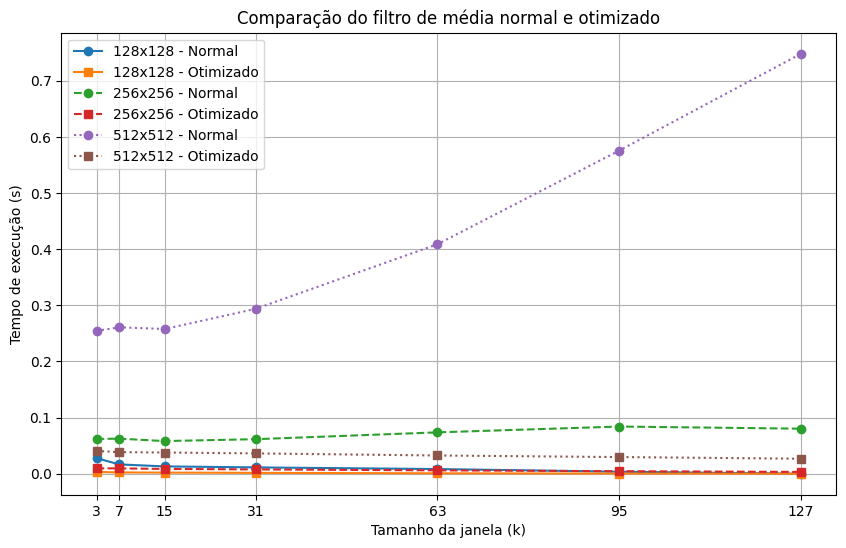

In [51]:
plt.figure(figsize=(10, 6))

plt.plot(k_values, normal_128, marker='o', label='128x128 - Normal')
plt.plot(k_values, otimizado_128, marker='s', label='128x128 - Otimizado')

plt.plot(k_values, normal_256, marker='o', linestyle='--', label='256x256 - Normal')
plt.plot(k_values, otimizado_256, marker='s', linestyle='--', label='256x256 - Otimizado')

plt.plot(k_values, normal_512, marker='o', linestyle=':', label='512x512 - Normal')
plt.plot(k_values, otimizado_512, marker='s', linestyle=':', label='512x512 - Otimizado')

plt.xlabel('Tamanho da janela (k)')
plt.ylabel('Tempo de execução (s)')
plt.title('Comparação do filtro de média normal e otimizado')

plt.xticks(k_values)

plt.grid(True)
plt.legend()

plt.show()

In [52]:
def filtro_mediana(imagem, k): # Filtro mediana
    altura, largura = imagem.shape
    resultado = np.zeros_like(imagem, dtype=float)

    raio = k // 2

    imagem_pad = np.pad(
        imagem,
        ((raio, raio), (raio, raio)),
        mode='edge'
    )

    for i in range(altura):
        for j in range(largura):
            janela = imagem_pad[
                i:i+k,
                j:j+k
            ]

            resultado[i, j] = np.median(janela)

    return resultado

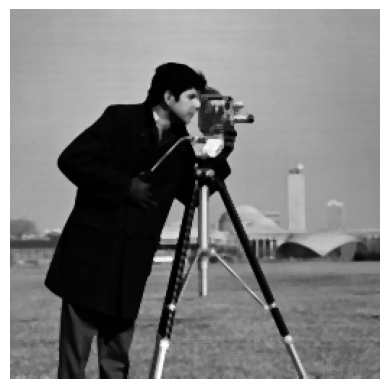

In [53]:
resultado_mediana = filtro_mediana(cameramen, 3)

plt.imshow(resultado_mediana, cmap='gray')
plt.axis('off')
plt.show()

In [54]:
def encontrar_mediana(histograma, quantidade):
    acumulado = np.cumsum(histograma)

    posicao = quantidade // 2

    return np.searchsorted(
        acumulado,
        posicao,
        side='right'
    )

In [55]:
def filtro_mediana_otimizado(imagem, k):
    imagem = imagem.astype(np.uint8)

    altura, largura = imagem.shape
    resultado = np.zeros_like(imagem, dtype=float)

    raio = k // 2

    imagem_pad = np.pad(
        imagem,
        ((raio, raio), (raio, raio)),
        mode='edge'
    )

    quantidade = k * k

    for i in range(altura):

        janela = imagem_pad[
            i:i+k,
            0:k
        ]

        histograma = np.bincount(
            janela.flatten(),
            minlength=256
        )

        resultado[i, 0] = encontrar_mediana(
            histograma,
            quantidade
        )

        for j in range(1, largura):

            coluna_saida = imagem_pad[
                i:i+k,
                j-1
            ]

            coluna_entrada = imagem_pad[
                i:i+k,
                j+k-1
            ]

            for valor in coluna_saida:
                histograma[valor] -= 1

            for valor in coluna_entrada:
                histograma[valor] += 1

            resultado[i, j] = encontrar_mediana(
                histograma,
                quantidade
            )

    return resultado

In [56]:
normal = filtro_mediana(cameramen, 5)
otimizado = filtro_mediana_otimizado(cameramen, 5)

erro_medio = np.mean(np.abs(normal - otimizado))
erro_maximo = np.max(np.abs(normal - otimizado))

print("Erro médio:", erro_medio)
print("Erro máximo:", erro_maximo)
print("Resultados iguais:", np.allclose(normal, otimizado))

Erro médio: 0.0
Erro máximo: 0.0
Resultados iguais: True


In [57]:
k = 7

inicio = time.perf_counter()
filtro_mediana(cameramen, k)
fim = time.perf_counter()

tempo_normal = fim - inicio

inicio = time.perf_counter()
filtro_mediana_otimizado(cameramen, k)
fim = time.perf_counter()

tempo_otimizado = fim - inicio

print(f"Normal: {tempo_normal:.6f}s")
print(f"Otimizado: {tempo_otimizado:.6f}s")

Normal: 1.402859s
Otimizado: 0.746680s


In [58]:
k_values = [3, 7, 15, 31, 63, 95, 127]

tempos_normal_128 = []
tempos_otimizado_128 = []

for k in k_values:
    inicio = time.perf_counter()
    filtro_mediana(cameramen_128, k)
    fim = time.perf_counter()
    tempo_normal = fim - inicio

    inicio = time.perf_counter()
    filtro_mediana_otimizado(cameramen_128, k)
    fim = time.perf_counter()
    tempo_otimizado = fim - inicio

    tempos_normal_128.append(tempo_normal)
    tempos_otimizado_128.append(tempo_otimizado)

    print(
        f"k={k}: imagem 128px "
        f"normal={tempo_normal:.6f}s | "
        f"otimizado={tempo_otimizado:.6f}s"
    )

tempos_normal = []
tempos_otimizado = []

for k in k_values:
    inicio = time.perf_counter()
    filtro_mediana(cameramen, k)
    fim = time.perf_counter()
    tempo_normal = fim - inicio

    inicio = time.perf_counter()
    filtro_mediana_otimizado(cameramen, k)
    fim = time.perf_counter()
    tempo_otimizado = fim - inicio

    tempos_normal.append(tempo_normal)
    tempos_otimizado.append(tempo_otimizado)

    print(
        f"k={k}: imagem 256px"
        f"normal={tempo_normal:.6f}s | "
        f"otimizado={tempo_otimizado:.6f}s"
    )


tempos_normal_512 = []
tempos_otimizado_512 = []

for k in k_values:
    inicio = time.perf_counter()
    filtro_mediana(cameramen_512, k)
    fim = time.perf_counter()
    tempo_normal = fim - inicio

    inicio = time.perf_counter()
    filtro_mediana_otimizado(cameramen_512, k)
    fim = time.perf_counter()
    tempo_otimizado = fim - inicio

    tempos_normal_512.append(tempo_normal)
    tempos_otimizado_512.append(tempo_otimizado)

    print(
        f"k={k}: imagem 512px "
        f"normal={tempo_normal:.6f}s | "
        f"otimizado={tempo_otimizado:.6f}s"
    )

k=3: imagem 128px normal=0.385941s | otimizado=0.195528s
k=7: imagem 128px normal=0.375448s | otimizado=0.232641s
k=15: imagem 128px normal=0.472711s | otimizado=0.233271s
k=31: imagem 128px normal=0.489367s | otimizado=0.427487s
k=63: imagem 128px normal=1.323831s | otimizado=1.299157s
k=95: imagem 128px normal=2.153679s | otimizado=0.920156s
k=127: imagem 128px normal=2.046037s | otimizado=1.204128s
k=3: imagem 256pxnormal=1.552127s | otimizado=0.743685s
k=7: imagem 256pxnormal=1.542876s | otimizado=0.653570s
k=15: imagem 256pxnormal=1.578405s | otimizado=1.596223s
k=31: imagem 256pxnormal=2.304055s | otimizado=1.717683s
k=63: imagem 256pxnormal=4.444825s | otimizado=3.296402s
k=95: imagem 256pxnormal=8.134056s | otimizado=4.604824s
k=127: imagem 256pxnormal=10.981005s | otimizado=6.867077s
k=3: imagem 512px normal=5.711330s | otimizado=2.464316s
k=7: imagem 512px normal=7.258685s | otimizado=2.941565s
k=15: imagem 512px normal=6.821479s | otimizado=4.688697s
k=31: imagem 512px norma

In [60]:
tempos_normal_128 = [
    0.125714,
    0.078605,
    0.089713,
    0.136539,
    0.290415,
    0.506783,
    0.769010
]

tempos_otimizado_128 = [
    0.050847,
    0.056184,
    0.077025,
    0.128152,
    0.214572,
    0.310290,
    0.395266
]

tempos_normal_256 = [
    0.295561,
    0.305909,
    0.363657,
    0.580789,
    1.317108,
    2.394298,
    3.792660
]

tempos_otimizado_256 = [
    0.170233,
    0.218301,
    0.304224,
    0.478599,
    0.856552,
    1.224745,
    1.637503
]

tempos_normal_512 = [
    1.178468,
    1.219694,
    1.421881,
    2.151226,
    4.751159,
    8.749174,
    13.800594
]

tempos_otimizado_512 = [
    0.694108,
    0.875660,
    1.221600,
    1.986664,
    3.537701,
    4.949834,
    6.495501
]

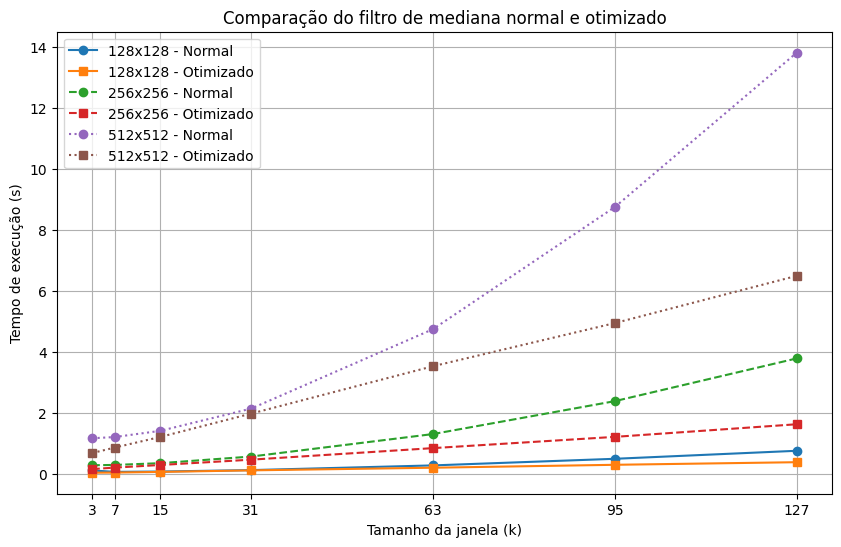

In [61]:
plt.figure(figsize=(10, 6))

plt.plot(k_values, tempos_normal_128,
         marker='o',
         label='128x128 - Normal')

plt.plot(k_values, tempos_otimizado_128,
         marker='s',
         label='128x128 - Otimizado')

plt.plot(k_values, tempos_normal_256,
         marker='o',
         linestyle='--',
         label='256x256 - Normal')

plt.plot(k_values, tempos_otimizado_256,
         marker='s',
         linestyle='--',
         label='256x256 - Otimizado')

plt.plot(k_values, tempos_normal_512,
         marker='o',
         linestyle=':',
         label='512x512 - Normal')

plt.plot(k_values, tempos_otimizado_512,
         marker='s',
         linestyle=':',
         label='512x512 - Otimizado')

plt.xlabel('Tamanho da janela (k)')
plt.ylabel('Tempo de execução (s)')
plt.title('Comparação do filtro de mediana normal e otimizado')

plt.xticks(k_values)

plt.grid(True)
plt.legend()

plt.show()